**Importing Libraries**

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np

**Data Preparation**

In [2]:

trainset = torchvision.datasets.MNIST(root = './data',train = True, download = True, transform = transforms.ToTensor())


In [3]:
trainloader = torch.utils.data.DataLoader(trainset,batch_size=64,shuffle=True)

**Model Development**

In [5]:
class GenBlock(nn.Module):
  def __init__(self,in_features,out_features):
    super(GenBlock,self).__init__()
    self.main = nn.Sequential(
        nn.Linear(in_features,out_features),
        nn.ReLU(True)
    )

  def forward(self,x):
    return self.main(x)


In [6]:
class Generator(nn.Module):
  def __init__(self):
    super(Generator,self).__init__()
    self.main = nn.Sequential(
        GenBlock(100,256),
        GenBlock(256,512),
        GenBlock(512,1024),
        nn.Linear(1024,28*28),
        nn.Tanh()  #Transforming the values in the range of -1 and 1
    )

  def forward(self,input):
    return self.main(input).view(-1,1,28,28)


In [7]:
class DisBlock(nn.Module):
  def __init__(self,in_features,out_features):
    super(DisBlock,self).__init__()
    self.main = nn.Sequential(
        nn.Linear(in_features,out_features),
        nn.LeakyReLU(0.2,inplace=True),
        nn.Dropout(0.2)
    )

  def forward(self,x):
    return self.main(x)

In [8]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            DisBlock(28*28, 1024),
            DisBlock(1024, 512),
            DisBlock(512, 256),
            nn.Linear(256, 1),  # Linear output without activation
        )

    def forward(self, input):
        return self.main(input.view(-1, 28*28))

**Initialization**

In [18]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)
generator = Generator().to(device)
discriminator = Discriminator().to(device)

# Wasserstein Loss implementation
def discriminator_loss(real_output, fake_output):
    return -(torch.mean(real_output) - torch.mean(fake_output)).to(device)

def generator_loss(fake_output):
    return -torch.mean(fake_output).to(device)

# Update Optimizers
OptimizerG = optim.RMSprop(generator.parameters(), lr=0.0002,)
OptimizerD = optim.RMSprop(discriminator.parameters(), lr=0.0002)

Using device: cuda


**Training**

Epoch [0/80] Batch 0/938                   Loss D: -0.0096, Loss G: -0.0100
Epoch [0/80] Batch 100/938                   Loss D: -7.5609, Loss G: 0.0059
Epoch [0/80] Batch 200/938                   Loss D: -0.1973, Loss G: -0.0316
Epoch [0/80] Batch 300/938                   Loss D: 5.2795, Loss G: -1.3848
Epoch [0/80] Batch 400/938                   Loss D: -0.2001, Loss G: 0.0132
Epoch [0/80] Batch 500/938                   Loss D: 0.0596, Loss G: -0.1964
Epoch [0/80] Batch 600/938                   Loss D: -0.1787, Loss G: 0.6269
Epoch [0/80] Batch 700/938                   Loss D: -0.7190, Loss G: 0.4757
Epoch [0/80] Batch 800/938                   Loss D: -1.2474, Loss G: 0.2455
Epoch [0/80] Batch 900/938                   Loss D: -0.7090, Loss G: 0.9403


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.4663434..0.9273755].


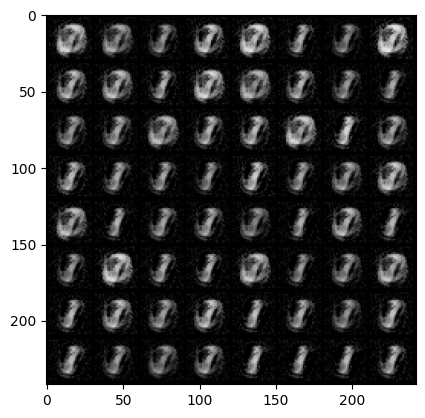

Epoch [1/80] Batch 0/938                   Loss D: -1.2833, Loss G: 0.8519
Epoch [1/80] Batch 100/938                   Loss D: -2.5184, Loss G: 0.5322
Epoch [1/80] Batch 200/938                   Loss D: -1.1955, Loss G: 1.1237
Epoch [1/80] Batch 300/938                   Loss D: -1.0424, Loss G: 1.2940
Epoch [1/80] Batch 400/938                   Loss D: -0.6596, Loss G: 0.8196
Epoch [1/80] Batch 500/938                   Loss D: -2.5158, Loss G: 1.2721
Epoch [1/80] Batch 600/938                   Loss D: 0.7144, Loss G: 0.1695
Epoch [1/80] Batch 700/938                   Loss D: -0.8379, Loss G: -0.0133
Epoch [1/80] Batch 800/938                   Loss D: -0.5391, Loss G: -0.3124
Epoch [1/80] Batch 900/938                   Loss D: -1.1409, Loss G: 1.2393


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.5999764..0.9914097].


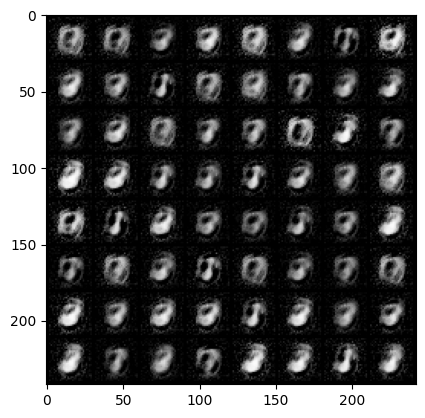

Epoch [2/80] Batch 0/938                   Loss D: -0.8285, Loss G: 0.4263
Epoch [2/80] Batch 100/938                   Loss D: 0.7088, Loss G: 0.5232
Epoch [2/80] Batch 200/938                   Loss D: -0.1366, Loss G: 0.6966
Epoch [2/80] Batch 300/938                   Loss D: -0.5873, Loss G: 0.1402
Epoch [2/80] Batch 400/938                   Loss D: -0.2839, Loss G: 0.3180
Epoch [2/80] Batch 500/938                   Loss D: -0.7052, Loss G: 0.5308
Epoch [2/80] Batch 600/938                   Loss D: -0.4621, Loss G: 1.2541
Epoch [2/80] Batch 700/938                   Loss D: -0.4330, Loss G: -0.0024
Epoch [2/80] Batch 800/938                   Loss D: 0.1283, Loss G: -0.2586
Epoch [2/80] Batch 900/938                   Loss D: -0.6409, Loss G: 0.4481


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9024259..0.99421585].


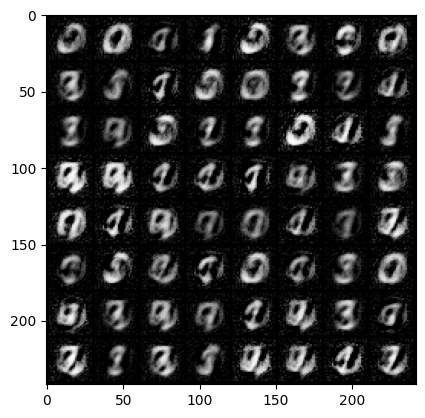

Epoch [3/80] Batch 0/938                   Loss D: -0.3040, Loss G: 0.4311
Epoch [3/80] Batch 100/938                   Loss D: -0.4884, Loss G: -0.2719
Epoch [3/80] Batch 200/938                   Loss D: -0.3061, Loss G: -0.1730
Epoch [3/80] Batch 300/938                   Loss D: -0.5227, Loss G: 1.1697
Epoch [3/80] Batch 400/938                   Loss D: 0.0592, Loss G: -0.7008
Epoch [3/80] Batch 500/938                   Loss D: -0.0511, Loss G: 0.1064
Epoch [3/80] Batch 600/938                   Loss D: -0.8620, Loss G: 1.3339
Epoch [3/80] Batch 700/938                   Loss D: -0.3146, Loss G: -0.3375
Epoch [3/80] Batch 800/938                   Loss D: -0.2595, Loss G: -0.0846
Epoch [3/80] Batch 900/938                   Loss D: -0.0746, Loss G: 0.6311


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9535156..0.99803114].


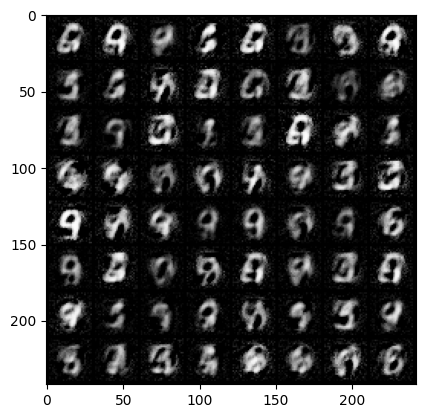

Epoch [4/80] Batch 0/938                   Loss D: -0.4707, Loss G: 0.1077
Epoch [4/80] Batch 100/938                   Loss D: -0.4959, Loss G: -0.0160
Epoch [4/80] Batch 200/938                   Loss D: -0.3284, Loss G: -0.1009
Epoch [4/80] Batch 300/938                   Loss D: -0.7450, Loss G: 0.9936
Epoch [4/80] Batch 400/938                   Loss D: -0.1174, Loss G: -0.1936
Epoch [4/80] Batch 500/938                   Loss D: -0.0772, Loss G: 0.2135
Epoch [4/80] Batch 600/938                   Loss D: -0.2959, Loss G: -0.3260
Epoch [4/80] Batch 700/938                   Loss D: -0.4600, Loss G: 0.5576
Epoch [4/80] Batch 800/938                   Loss D: -0.3752, Loss G: 0.0089
Epoch [4/80] Batch 900/938                   Loss D: -0.5131, Loss G: 0.4453


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9350435..0.99938077].


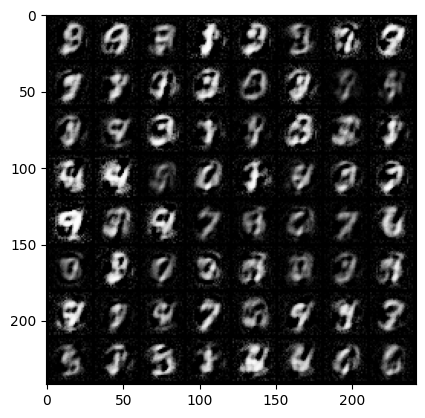

Epoch [5/80] Batch 0/938                   Loss D: -0.1697, Loss G: -1.2631
Epoch [5/80] Batch 100/938                   Loss D: -0.2772, Loss G: 0.2244
Epoch [5/80] Batch 200/938                   Loss D: -0.5399, Loss G: 0.6540
Epoch [5/80] Batch 300/938                   Loss D: -0.5020, Loss G: 0.2684
Epoch [5/80] Batch 400/938                   Loss D: -0.4302, Loss G: -0.1271
Epoch [5/80] Batch 500/938                   Loss D: -0.1463, Loss G: 0.0255
Epoch [5/80] Batch 600/938                   Loss D: -0.3476, Loss G: 0.6136
Epoch [5/80] Batch 700/938                   Loss D: -0.1400, Loss G: 0.3544
Epoch [5/80] Batch 800/938                   Loss D: -0.4075, Loss G: -0.6490
Epoch [5/80] Batch 900/938                   Loss D: -0.5770, Loss G: 0.6702


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9646215..0.99963796].


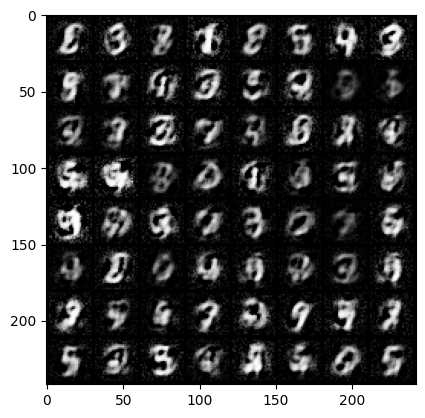

Epoch [6/80] Batch 0/938                   Loss D: -0.2521, Loss G: 0.5943
Epoch [6/80] Batch 100/938                   Loss D: -0.3528, Loss G: 1.3616
Epoch [6/80] Batch 200/938                   Loss D: -0.2138, Loss G: 1.1770
Epoch [6/80] Batch 300/938                   Loss D: -0.4014, Loss G: -0.2925
Epoch [6/80] Batch 400/938                   Loss D: -0.1672, Loss G: -0.0462
Epoch [6/80] Batch 500/938                   Loss D: -0.2963, Loss G: -0.7346
Epoch [6/80] Batch 600/938                   Loss D: -0.1698, Loss G: -0.3474
Epoch [6/80] Batch 700/938                   Loss D: -0.0573, Loss G: 0.2593
Epoch [6/80] Batch 800/938                   Loss D: -0.2083, Loss G: -0.5222
Epoch [6/80] Batch 900/938                   Loss D: -0.4138, Loss G: -0.0629


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.96540946..0.9999985].


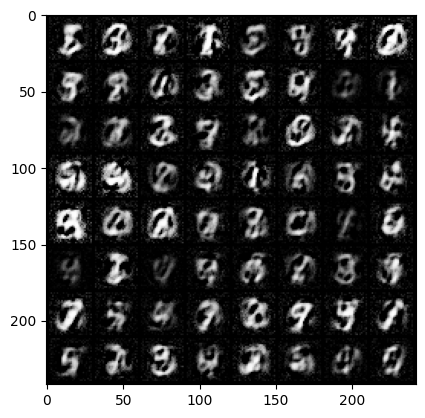

Epoch [7/80] Batch 0/938                   Loss D: -0.1305, Loss G: 0.3067
Epoch [7/80] Batch 100/938                   Loss D: -0.1831, Loss G: -0.0487
Epoch [7/80] Batch 200/938                   Loss D: -0.3225, Loss G: 0.7692
Epoch [7/80] Batch 300/938                   Loss D: -0.0943, Loss G: -0.5457
Epoch [7/80] Batch 400/938                   Loss D: -0.2672, Loss G: -0.2300
Epoch [7/80] Batch 500/938                   Loss D: -0.1456, Loss G: 0.1520
Epoch [7/80] Batch 600/938                   Loss D: -0.3048, Loss G: 0.5692
Epoch [7/80] Batch 700/938                   Loss D: -0.2828, Loss G: -0.0400
Epoch [7/80] Batch 800/938                   Loss D: -0.3407, Loss G: 0.0204
Epoch [7/80] Batch 900/938                   Loss D: -0.3273, Loss G: 1.1534


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9661302..0.99999195].


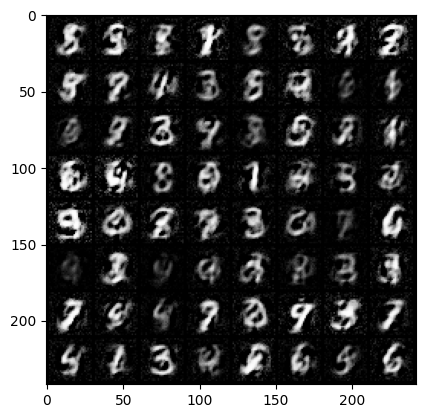

Epoch [8/80] Batch 0/938                   Loss D: -0.3975, Loss G: -0.5702
Epoch [8/80] Batch 100/938                   Loss D: -0.2341, Loss G: -0.1691
Epoch [8/80] Batch 200/938                   Loss D: -0.0652, Loss G: -0.3566
Epoch [8/80] Batch 300/938                   Loss D: -0.1656, Loss G: 0.5987
Epoch [8/80] Batch 400/938                   Loss D: -0.2482, Loss G: 0.5184
Epoch [8/80] Batch 500/938                   Loss D: -0.2530, Loss G: -0.4072
Epoch [8/80] Batch 600/938                   Loss D: -0.1238, Loss G: -0.5452
Epoch [8/80] Batch 700/938                   Loss D: -0.1940, Loss G: 0.5203
Epoch [8/80] Batch 800/938                   Loss D: -0.3015, Loss G: 0.1096
Epoch [8/80] Batch 900/938                   Loss D: -0.2641, Loss G: 0.8383


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99474156..0.99995035].


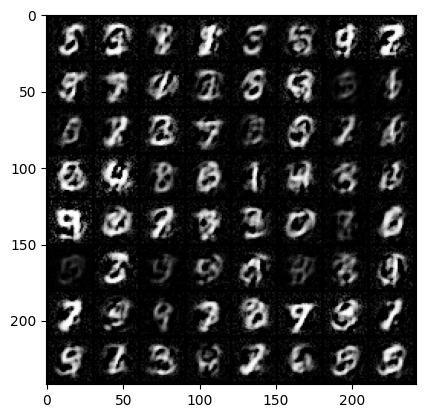

Epoch [9/80] Batch 0/938                   Loss D: -0.1906, Loss G: 0.2486
Epoch [9/80] Batch 100/938                   Loss D: -0.1354, Loss G: -0.3084
Epoch [9/80] Batch 200/938                   Loss D: -0.1853, Loss G: 0.3568
Epoch [9/80] Batch 300/938                   Loss D: -0.2651, Loss G: -0.1651
Epoch [9/80] Batch 400/938                   Loss D: -0.2189, Loss G: -0.0511
Epoch [9/80] Batch 500/938                   Loss D: -0.0459, Loss G: 0.8075
Epoch [9/80] Batch 600/938                   Loss D: 0.0087, Loss G: -0.4700
Epoch [9/80] Batch 700/938                   Loss D: -0.2132, Loss G: -0.1595
Epoch [9/80] Batch 800/938                   Loss D: -0.1537, Loss G: 0.4804
Epoch [9/80] Batch 900/938                   Loss D: -0.0698, Loss G: 0.1604


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9866231..0.9999864].


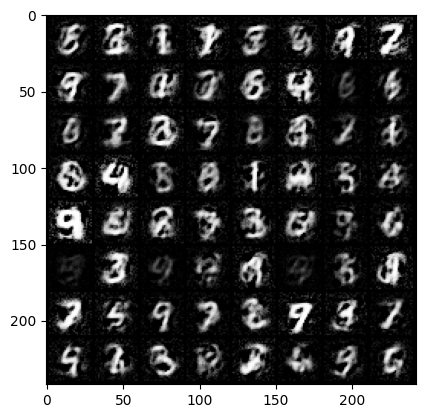

Epoch [10/80] Batch 0/938                   Loss D: -0.1958, Loss G: 0.8852
Epoch [10/80] Batch 100/938                   Loss D: -0.2126, Loss G: 0.0117
Epoch [10/80] Batch 200/938                   Loss D: -0.2474, Loss G: -0.1743
Epoch [10/80] Batch 300/938                   Loss D: -0.2354, Loss G: 1.1375
Epoch [10/80] Batch 400/938                   Loss D: -0.1604, Loss G: 0.1431
Epoch [10/80] Batch 500/938                   Loss D: -0.0799, Loss G: -0.0672
Epoch [10/80] Batch 600/938                   Loss D: -0.1536, Loss G: 0.0098
Epoch [10/80] Batch 700/938                   Loss D: 0.1211, Loss G: -0.9036
Epoch [10/80] Batch 800/938                   Loss D: -0.2017, Loss G: 0.2770
Epoch [10/80] Batch 900/938                   Loss D: -0.1286, Loss G: 0.6671


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9913734..0.9999963].


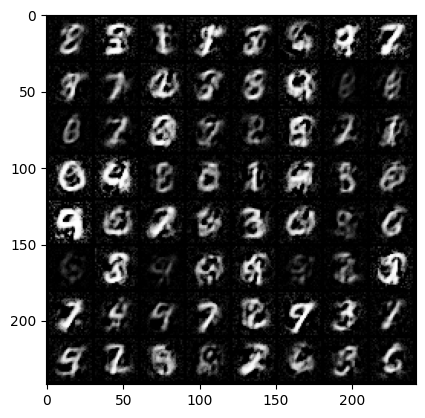

Epoch [11/80] Batch 0/938                   Loss D: -0.1930, Loss G: -0.6848
Epoch [11/80] Batch 100/938                   Loss D: -0.2050, Loss G: 0.0805
Epoch [11/80] Batch 200/938                   Loss D: -0.2754, Loss G: 0.6262
Epoch [11/80] Batch 300/938                   Loss D: -0.2073, Loss G: 0.6067
Epoch [11/80] Batch 400/938                   Loss D: -0.0774, Loss G: -0.4363
Epoch [11/80] Batch 500/938                   Loss D: -0.0557, Loss G: -0.5879
Epoch [11/80] Batch 600/938                   Loss D: -0.1488, Loss G: 0.8529
Epoch [11/80] Batch 700/938                   Loss D: -0.0782, Loss G: 0.2408
Epoch [11/80] Batch 800/938                   Loss D: -0.0867, Loss G: 0.2638
Epoch [11/80] Batch 900/938                   Loss D: -0.2560, Loss G: -0.9571


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9775133..0.999995].


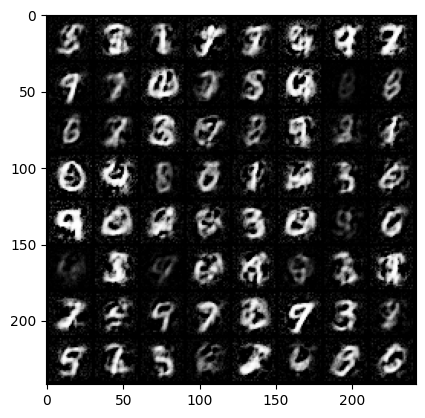

Epoch [12/80] Batch 0/938                   Loss D: -0.1648, Loss G: 0.1834
Epoch [12/80] Batch 100/938                   Loss D: -0.0999, Loss G: -0.1428
Epoch [12/80] Batch 200/938                   Loss D: -0.0208, Loss G: -0.4627
Epoch [12/80] Batch 300/938                   Loss D: -0.0735, Loss G: -0.0474
Epoch [12/80] Batch 400/938                   Loss D: -0.1470, Loss G: 0.9314
Epoch [12/80] Batch 500/938                   Loss D: -0.1868, Loss G: -0.0613
Epoch [12/80] Batch 600/938                   Loss D: -0.0108, Loss G: 0.0742
Epoch [12/80] Batch 700/938                   Loss D: -0.1794, Loss G: 0.9497
Epoch [12/80] Batch 800/938                   Loss D: -0.2703, Loss G: 0.7083
Epoch [12/80] Batch 900/938                   Loss D: -0.0254, Loss G: -0.5331


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.98185617..0.9999982].


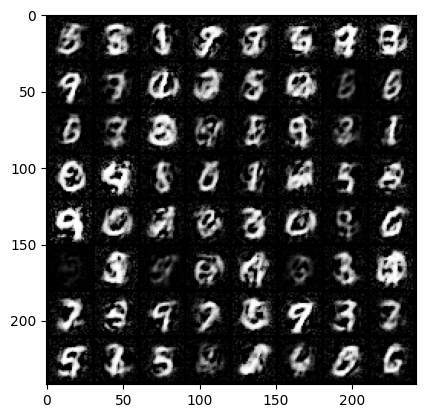

Epoch [13/80] Batch 0/938                   Loss D: 0.2602, Loss G: -0.3672
Epoch [13/80] Batch 100/938                   Loss D: -0.0863, Loss G: -0.2809
Epoch [13/80] Batch 200/938                   Loss D: -0.1531, Loss G: 0.1091
Epoch [13/80] Batch 300/938                   Loss D: -0.3406, Loss G: 1.2459
Epoch [13/80] Batch 400/938                   Loss D: -0.0806, Loss G: 0.5753
Epoch [13/80] Batch 500/938                   Loss D: -0.1003, Loss G: 0.4287
Epoch [13/80] Batch 600/938                   Loss D: -0.1945, Loss G: -0.4458
Epoch [13/80] Batch 700/938                   Loss D: -0.0381, Loss G: 0.2857
Epoch [13/80] Batch 800/938                   Loss D: -0.0135, Loss G: -0.4200
Epoch [13/80] Batch 900/938                   Loss D: -0.0404, Loss G: 0.1274


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9656602..0.99999505].


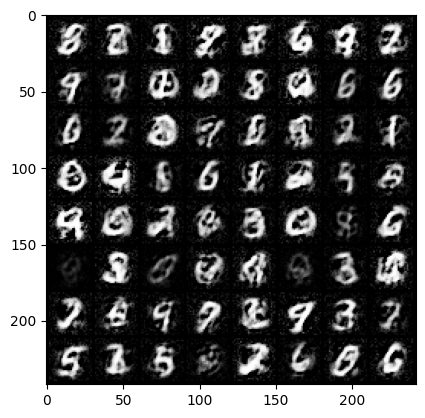

Epoch [14/80] Batch 0/938                   Loss D: 0.1422, Loss G: 0.6183
Epoch [14/80] Batch 100/938                   Loss D: -0.1573, Loss G: 0.0364
Epoch [14/80] Batch 200/938                   Loss D: -0.0824, Loss G: 0.6608
Epoch [14/80] Batch 300/938                   Loss D: -0.2405, Loss G: 0.2665
Epoch [14/80] Batch 400/938                   Loss D: -0.0746, Loss G: 0.0681
Epoch [14/80] Batch 500/938                   Loss D: -0.1670, Loss G: 0.5728
Epoch [14/80] Batch 600/938                   Loss D: -0.2233, Loss G: -0.0265
Epoch [14/80] Batch 700/938                   Loss D: -0.1598, Loss G: -0.0332
Epoch [14/80] Batch 800/938                   Loss D: 0.0132, Loss G: -0.5347
Epoch [14/80] Batch 900/938                   Loss D: -0.2307, Loss G: -0.1290


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9752672..0.99999607].


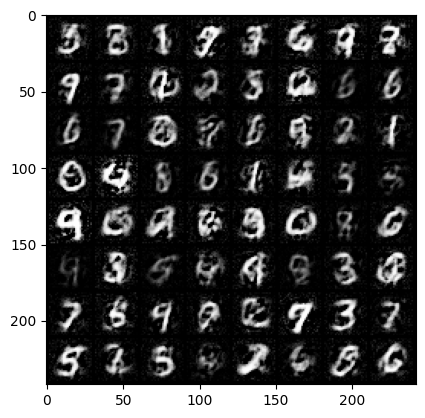

Epoch [15/80] Batch 0/938                   Loss D: -0.0850, Loss G: -0.3372
Epoch [15/80] Batch 100/938                   Loss D: 0.0234, Loss G: 0.7831
Epoch [15/80] Batch 200/938                   Loss D: 0.0025, Loss G: -0.0051
Epoch [15/80] Batch 300/938                   Loss D: -0.1365, Loss G: -0.1665
Epoch [15/80] Batch 400/938                   Loss D: 0.0048, Loss G: -0.2755
Epoch [15/80] Batch 500/938                   Loss D: -0.1581, Loss G: -0.2785
Epoch [15/80] Batch 600/938                   Loss D: -0.2057, Loss G: -0.1428
Epoch [15/80] Batch 700/938                   Loss D: -0.0800, Loss G: 0.4860
Epoch [15/80] Batch 800/938                   Loss D: -0.2401, Loss G: 0.4358
Epoch [15/80] Batch 900/938                   Loss D: 0.0485, Loss G: 0.0112


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.97931206..0.99999917].


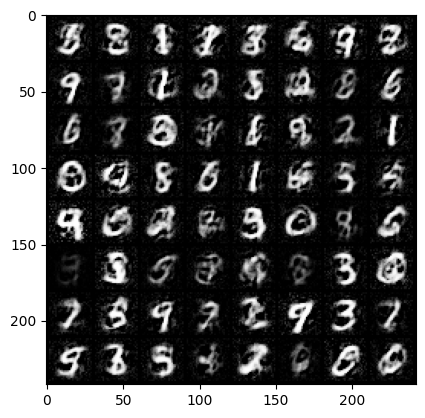

Epoch [16/80] Batch 0/938                   Loss D: -0.3173, Loss G: 0.7717
Epoch [16/80] Batch 100/938                   Loss D: -0.0203, Loss G: -0.3366
Epoch [16/80] Batch 200/938                   Loss D: -0.1885, Loss G: 0.2373
Epoch [16/80] Batch 300/938                   Loss D: -0.0634, Loss G: 0.6154
Epoch [16/80] Batch 400/938                   Loss D: -0.0632, Loss G: -0.0175
Epoch [16/80] Batch 500/938                   Loss D: -0.1539, Loss G: -0.4578
Epoch [16/80] Batch 600/938                   Loss D: -0.2055, Loss G: -0.3352
Epoch [16/80] Batch 700/938                   Loss D: -0.0374, Loss G: 0.4791
Epoch [16/80] Batch 800/938                   Loss D: -0.0629, Loss G: -0.3056
Epoch [16/80] Batch 900/938                   Loss D: -0.3317, Loss G: -0.4013


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.98438716..0.9999994].


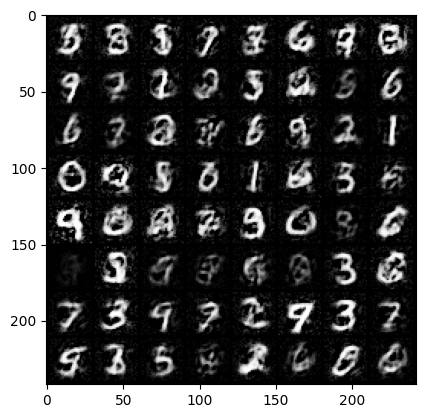

Epoch [17/80] Batch 0/938                   Loss D: -0.1173, Loss G: -0.7842
Epoch [17/80] Batch 100/938                   Loss D: -0.0638, Loss G: -0.6248
Epoch [17/80] Batch 200/938                   Loss D: -0.1371, Loss G: -0.1166
Epoch [17/80] Batch 300/938                   Loss D: 0.0531, Loss G: -0.0182
Epoch [17/80] Batch 400/938                   Loss D: -0.0149, Loss G: 0.3782
Epoch [17/80] Batch 500/938                   Loss D: -0.1460, Loss G: -0.3300
Epoch [17/80] Batch 600/938                   Loss D: -0.2588, Loss G: 0.3661
Epoch [17/80] Batch 700/938                   Loss D: -0.2087, Loss G: 0.1328
Epoch [17/80] Batch 800/938                   Loss D: -0.1163, Loss G: -0.4978
Epoch [17/80] Batch 900/938                   Loss D: 0.2293, Loss G: -0.3230


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.98845625..1.0].


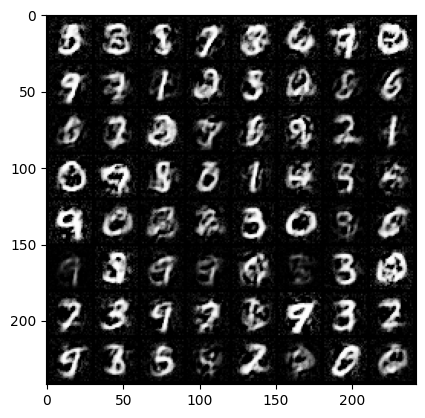

Epoch [18/80] Batch 0/938                   Loss D: -0.1077, Loss G: 0.3375
Epoch [18/80] Batch 100/938                   Loss D: 0.0725, Loss G: 0.0552
Epoch [18/80] Batch 200/938                   Loss D: -0.0721, Loss G: -0.3844
Epoch [18/80] Batch 300/938                   Loss D: -0.2213, Loss G: 0.8251
Epoch [18/80] Batch 400/938                   Loss D: -0.3062, Loss G: 0.7447
Epoch [18/80] Batch 500/938                   Loss D: -0.1302, Loss G: 0.1704
Epoch [18/80] Batch 600/938                   Loss D: -0.0510, Loss G: 0.2827
Epoch [18/80] Batch 700/938                   Loss D: 0.0277, Loss G: -0.0739
Epoch [18/80] Batch 800/938                   Loss D: -0.1511, Loss G: 0.2691
Epoch [18/80] Batch 900/938                   Loss D: -0.1832, Loss G: 0.0419


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.97759..0.99999994].


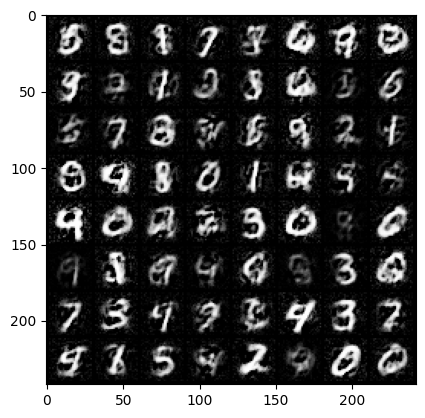

Epoch [19/80] Batch 0/938                   Loss D: -0.1898, Loss G: 0.2368
Epoch [19/80] Batch 100/938                   Loss D: -0.0407, Loss G: 0.6133
Epoch [19/80] Batch 200/938                   Loss D: -0.0856, Loss G: -0.3809
Epoch [19/80] Batch 300/938                   Loss D: -0.0340, Loss G: 0.6078
Epoch [19/80] Batch 400/938                   Loss D: 0.0917, Loss G: -0.2855
Epoch [19/80] Batch 500/938                   Loss D: -0.2634, Loss G: 0.8894
Epoch [19/80] Batch 600/938                   Loss D: -0.1453, Loss G: -0.7039
Epoch [19/80] Batch 700/938                   Loss D: -0.0733, Loss G: 0.5845
Epoch [19/80] Batch 800/938                   Loss D: -0.0677, Loss G: -0.6561
Epoch [19/80] Batch 900/938                   Loss D: -0.1357, Loss G: -0.3612


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9672066..0.99999845].


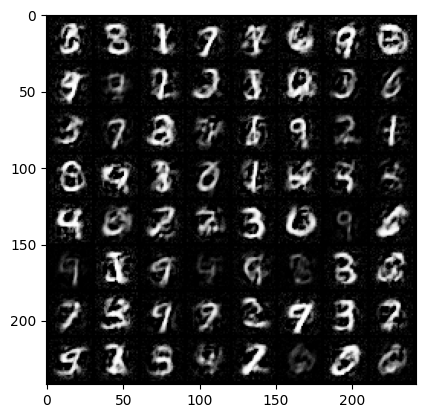

Epoch [20/80] Batch 0/938                   Loss D: 0.0021, Loss G: -0.4230
Epoch [20/80] Batch 100/938                   Loss D: 0.0278, Loss G: 0.6010
Epoch [20/80] Batch 200/938                   Loss D: 0.0143, Loss G: -0.4914
Epoch [20/80] Batch 300/938                   Loss D: -0.0869, Loss G: -0.0178
Epoch [20/80] Batch 400/938                   Loss D: -0.1704, Loss G: 0.4263
Epoch [20/80] Batch 500/938                   Loss D: -0.0743, Loss G: -0.0516
Epoch [20/80] Batch 600/938                   Loss D: -0.0352, Loss G: -0.1312
Epoch [20/80] Batch 700/938                   Loss D: 0.0415, Loss G: -0.3370
Epoch [20/80] Batch 800/938                   Loss D: -0.1001, Loss G: 0.3575
Epoch [20/80] Batch 900/938                   Loss D: -0.0062, Loss G: -0.3947


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.98543435..0.99999875].


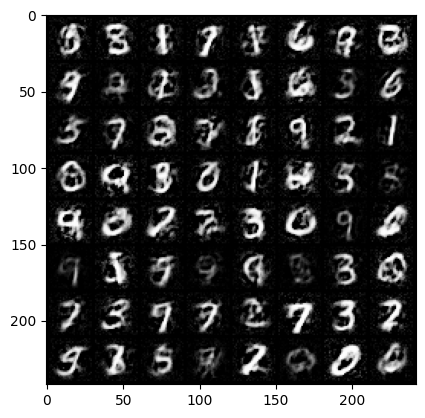

Epoch [21/80] Batch 0/938                   Loss D: -0.1379, Loss G: 0.9412
Epoch [21/80] Batch 100/938                   Loss D: -0.1748, Loss G: 0.0333
Epoch [21/80] Batch 200/938                   Loss D: -0.1805, Loss G: -0.3206
Epoch [21/80] Batch 300/938                   Loss D: -0.0131, Loss G: 0.2468
Epoch [21/80] Batch 400/938                   Loss D: -0.0495, Loss G: -0.2258
Epoch [21/80] Batch 500/938                   Loss D: -0.1340, Loss G: 0.2582
Epoch [21/80] Batch 600/938                   Loss D: -0.0028, Loss G: -0.2326
Epoch [21/80] Batch 700/938                   Loss D: -0.1747, Loss G: -0.0351
Epoch [21/80] Batch 800/938                   Loss D: 0.0033, Loss G: -0.3089
Epoch [21/80] Batch 900/938                   Loss D: -0.0010, Loss G: 0.2637


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9710134..0.9999995].


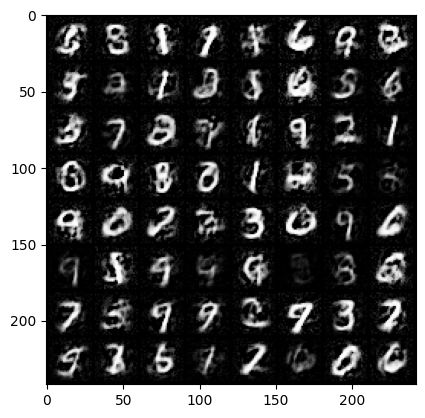

Epoch [22/80] Batch 0/938                   Loss D: -0.1017, Loss G: -0.0423
Epoch [22/80] Batch 100/938                   Loss D: -0.0475, Loss G: 0.0466
Epoch [22/80] Batch 200/938                   Loss D: -0.0365, Loss G: -0.2661
Epoch [22/80] Batch 300/938                   Loss D: -0.0813, Loss G: 0.0341
Epoch [22/80] Batch 400/938                   Loss D: -0.0673, Loss G: -0.5191
Epoch [22/80] Batch 500/938                   Loss D: -0.0026, Loss G: 0.2181
Epoch [22/80] Batch 600/938                   Loss D: -0.1435, Loss G: 0.5514
Epoch [22/80] Batch 700/938                   Loss D: -0.0863, Loss G: 0.1767
Epoch [22/80] Batch 800/938                   Loss D: -0.1105, Loss G: -0.0594
Epoch [22/80] Batch 900/938                   Loss D: -0.0304, Loss G: -0.0628


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.94783294..0.9999997].


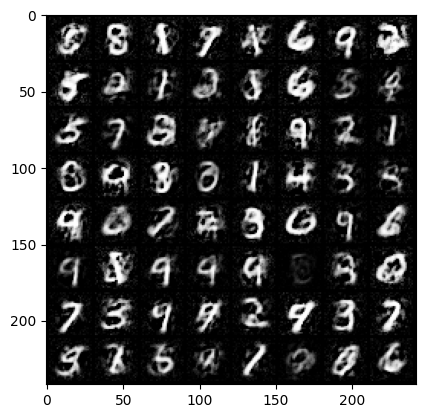

Epoch [23/80] Batch 0/938                   Loss D: -0.1183, Loss G: -0.2463
Epoch [23/80] Batch 100/938                   Loss D: -0.1933, Loss G: 0.7750
Epoch [23/80] Batch 200/938                   Loss D: -0.1340, Loss G: -0.4227
Epoch [23/80] Batch 300/938                   Loss D: -0.1128, Loss G: -0.0793
Epoch [23/80] Batch 400/938                   Loss D: 0.0187, Loss G: 0.4553
Epoch [23/80] Batch 500/938                   Loss D: -0.0044, Loss G: 0.0794
Epoch [23/80] Batch 600/938                   Loss D: -0.0074, Loss G: -0.4147
Epoch [23/80] Batch 700/938                   Loss D: 0.0296, Loss G: -0.1240
Epoch [23/80] Batch 800/938                   Loss D: -0.1178, Loss G: -0.2042
Epoch [23/80] Batch 900/938                   Loss D: 0.0122, Loss G: -0.4020


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.98885506..0.9999986].


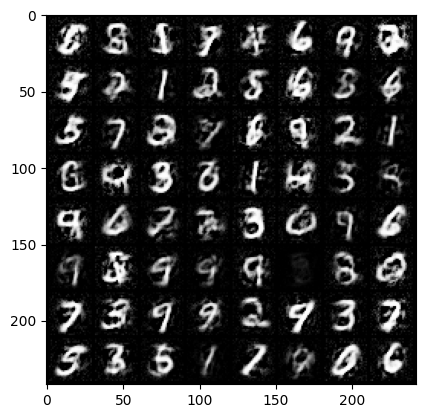

Epoch [24/80] Batch 0/938                   Loss D: -0.1287, Loss G: 0.2597
Epoch [24/80] Batch 100/938                   Loss D: -0.1582, Loss G: 0.3619
Epoch [24/80] Batch 200/938                   Loss D: -0.1493, Loss G: -0.0858
Epoch [24/80] Batch 300/938                   Loss D: 0.1478, Loss G: -0.0845
Epoch [24/80] Batch 400/938                   Loss D: -0.0798, Loss G: -0.2438
Epoch [24/80] Batch 500/938                   Loss D: 0.0392, Loss G: -0.2041
Epoch [24/80] Batch 600/938                   Loss D: -0.0036, Loss G: -0.0539
Epoch [24/80] Batch 700/938                   Loss D: -0.1416, Loss G: 0.2242
Epoch [24/80] Batch 800/938                   Loss D: 0.0095, Loss G: 0.2338
Epoch [24/80] Batch 900/938                   Loss D: 0.1540, Loss G: 0.5502


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9652387..0.99999726].


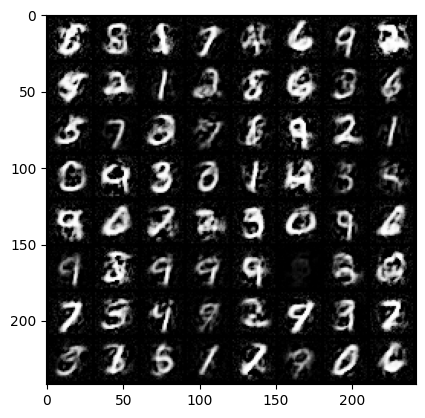

Epoch [25/80] Batch 0/938                   Loss D: -0.1090, Loss G: 0.3590
Epoch [25/80] Batch 100/938                   Loss D: 0.0116, Loss G: 0.0835
Epoch [25/80] Batch 200/938                   Loss D: -0.1406, Loss G: 0.0038
Epoch [25/80] Batch 300/938                   Loss D: -0.0191, Loss G: 0.2744
Epoch [25/80] Batch 400/938                   Loss D: -0.1543, Loss G: -0.2615
Epoch [25/80] Batch 500/938                   Loss D: 0.0207, Loss G: -0.0935
Epoch [25/80] Batch 600/938                   Loss D: -0.0671, Loss G: -0.1963
Epoch [25/80] Batch 700/938                   Loss D: 0.0848, Loss G: 0.5414
Epoch [25/80] Batch 800/938                   Loss D: 0.1028, Loss G: 0.2412
Epoch [25/80] Batch 900/938                   Loss D: -0.0693, Loss G: 0.0133


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9256822..0.99999946].


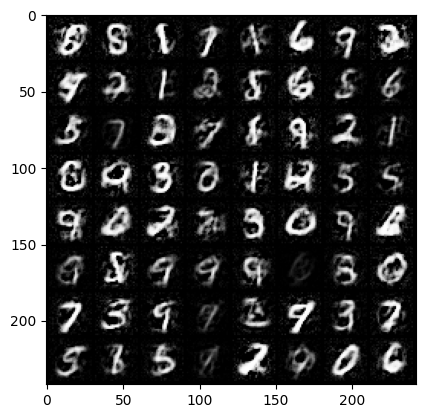

Epoch [26/80] Batch 0/938                   Loss D: -0.0896, Loss G: -0.2877
Epoch [26/80] Batch 100/938                   Loss D: -0.0649, Loss G: -0.0815
Epoch [26/80] Batch 200/938                   Loss D: 0.0824, Loss G: -0.1945
Epoch [26/80] Batch 300/938                   Loss D: -0.1409, Loss G: -0.5197
Epoch [26/80] Batch 400/938                   Loss D: 0.0136, Loss G: -0.3177
Epoch [26/80] Batch 500/938                   Loss D: -0.1293, Loss G: 0.4604
Epoch [26/80] Batch 600/938                   Loss D: -0.0567, Loss G: 0.0100
Epoch [26/80] Batch 700/938                   Loss D: -0.0407, Loss G: -0.3021
Epoch [26/80] Batch 800/938                   Loss D: 0.0250, Loss G: 0.0026
Epoch [26/80] Batch 900/938                   Loss D: -0.1105, Loss G: 0.6852


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.98635155..0.99999964].


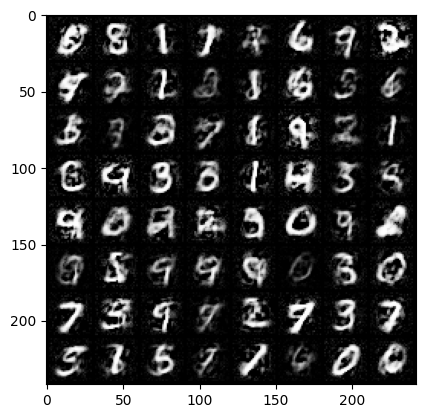

Epoch [27/80] Batch 0/938                   Loss D: 0.0506, Loss G: 0.0617
Epoch [27/80] Batch 100/938                   Loss D: 0.2175, Loss G: -0.0879
Epoch [27/80] Batch 200/938                   Loss D: 0.0657, Loss G: -0.1759
Epoch [27/80] Batch 300/938                   Loss D: -0.2061, Loss G: 0.1931
Epoch [27/80] Batch 400/938                   Loss D: -0.1461, Loss G: 0.1942
Epoch [27/80] Batch 500/938                   Loss D: -0.0026, Loss G: -0.0074
Epoch [27/80] Batch 600/938                   Loss D: -0.1940, Loss G: -0.0267
Epoch [27/80] Batch 700/938                   Loss D: -0.1544, Loss G: 0.3357
Epoch [27/80] Batch 800/938                   Loss D: -0.0608, Loss G: 0.4662
Epoch [27/80] Batch 900/938                   Loss D: 0.0972, Loss G: 0.3997


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.97127426..1.0].


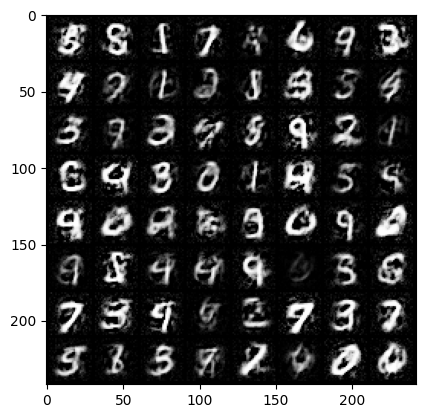

Epoch [28/80] Batch 0/938                   Loss D: -0.0345, Loss G: 0.0248
Epoch [28/80] Batch 100/938                   Loss D: -0.0597, Loss G: -0.2418
Epoch [28/80] Batch 200/938                   Loss D: -0.0278, Loss G: 0.0648
Epoch [28/80] Batch 300/938                   Loss D: -0.0810, Loss G: -0.1140
Epoch [28/80] Batch 400/938                   Loss D: -0.1155, Loss G: -0.4045
Epoch [28/80] Batch 500/938                   Loss D: -0.1487, Loss G: -0.2256
Epoch [28/80] Batch 600/938                   Loss D: -0.0164, Loss G: -0.0843
Epoch [28/80] Batch 700/938                   Loss D: -0.0310, Loss G: 0.2192
Epoch [28/80] Batch 800/938                   Loss D: -0.0450, Loss G: -0.0473
Epoch [28/80] Batch 900/938                   Loss D: -0.0435, Loss G: -0.3685


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9643106..0.9999979].


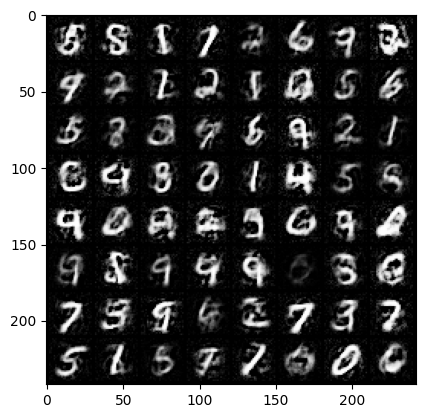

Epoch [29/80] Batch 0/938                   Loss D: -0.1084, Loss G: 0.6520
Epoch [29/80] Batch 100/938                   Loss D: -0.0986, Loss G: -0.3549
Epoch [29/80] Batch 200/938                   Loss D: 0.0160, Loss G: -0.2100
Epoch [29/80] Batch 300/938                   Loss D: 0.0235, Loss G: 0.3756
Epoch [29/80] Batch 400/938                   Loss D: 0.2135, Loss G: 0.3974
Epoch [29/80] Batch 500/938                   Loss D: -0.0011, Loss G: -0.1316
Epoch [29/80] Batch 600/938                   Loss D: 0.0395, Loss G: 0.3382
Epoch [29/80] Batch 700/938                   Loss D: 0.0531, Loss G: 0.0239
Epoch [29/80] Batch 800/938                   Loss D: -0.0026, Loss G: -0.2220
Epoch [29/80] Batch 900/938                   Loss D: 0.1231, Loss G: 0.4026


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9599537..0.9999995].


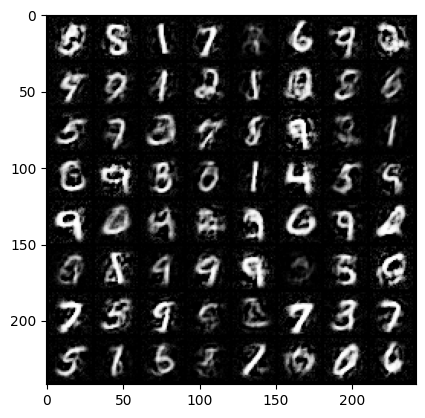

Epoch [30/80] Batch 0/938                   Loss D: 0.0119, Loss G: -0.1884
Epoch [30/80] Batch 100/938                   Loss D: -0.0237, Loss G: -0.2786
Epoch [30/80] Batch 200/938                   Loss D: -0.0678, Loss G: -0.4405
Epoch [30/80] Batch 300/938                   Loss D: -0.1811, Loss G: 0.3698
Epoch [30/80] Batch 400/938                   Loss D: -0.0891, Loss G: 0.5915
Epoch [30/80] Batch 500/938                   Loss D: -0.0470, Loss G: -0.4729
Epoch [30/80] Batch 600/938                   Loss D: 0.0599, Loss G: -0.0815
Epoch [30/80] Batch 700/938                   Loss D: -0.0536, Loss G: -0.2040
Epoch [30/80] Batch 800/938                   Loss D: -0.1766, Loss G: 0.0488
Epoch [30/80] Batch 900/938                   Loss D: -0.0433, Loss G: 0.2104


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9724051..0.9999992].


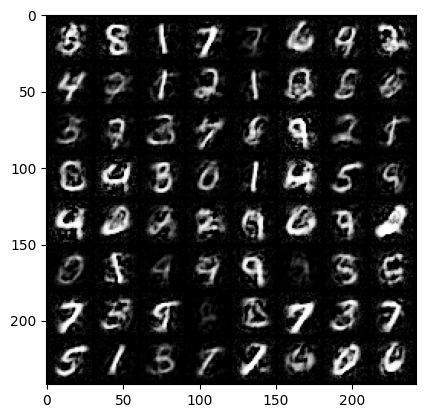

Epoch [31/80] Batch 0/938                   Loss D: 0.0529, Loss G: 0.4257
Epoch [31/80] Batch 100/938                   Loss D: -0.1059, Loss G: 0.4432
Epoch [31/80] Batch 200/938                   Loss D: 0.0052, Loss G: -0.2823
Epoch [31/80] Batch 300/938                   Loss D: -0.0363, Loss G: 0.4313
Epoch [31/80] Batch 400/938                   Loss D: -0.0941, Loss G: 0.6515
Epoch [31/80] Batch 500/938                   Loss D: -0.0587, Loss G: 0.7462
Epoch [31/80] Batch 600/938                   Loss D: -0.1252, Loss G: 0.3546
Epoch [31/80] Batch 700/938                   Loss D: -0.0060, Loss G: 0.0269
Epoch [31/80] Batch 800/938                   Loss D: -0.0122, Loss G: 0.3807
Epoch [31/80] Batch 900/938                   Loss D: -0.1202, Loss G: 0.0312


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9844465..1.0].


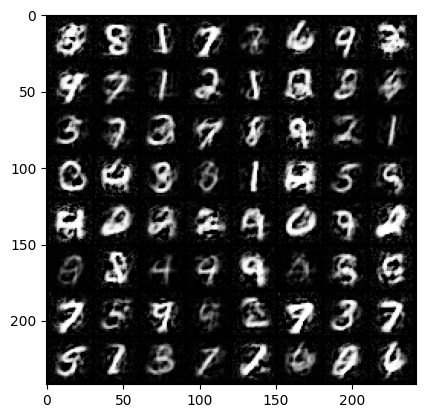

Epoch [32/80] Batch 0/938                   Loss D: 0.0849, Loss G: 0.2339
Epoch [32/80] Batch 100/938                   Loss D: -0.0134, Loss G: 0.0924
Epoch [32/80] Batch 200/938                   Loss D: -0.0347, Loss G: -0.5224
Epoch [32/80] Batch 300/938                   Loss D: -0.0903, Loss G: -0.1112
Epoch [32/80] Batch 400/938                   Loss D: -0.0757, Loss G: 0.0596
Epoch [32/80] Batch 500/938                   Loss D: 0.0509, Loss G: -0.1028
Epoch [32/80] Batch 600/938                   Loss D: -0.0292, Loss G: -0.0559
Epoch [32/80] Batch 700/938                   Loss D: -0.0352, Loss G: 0.5716
Epoch [32/80] Batch 800/938                   Loss D: -0.0650, Loss G: -0.0288
Epoch [32/80] Batch 900/938                   Loss D: -0.0628, Loss G: 0.4463


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9821234..0.9999997].


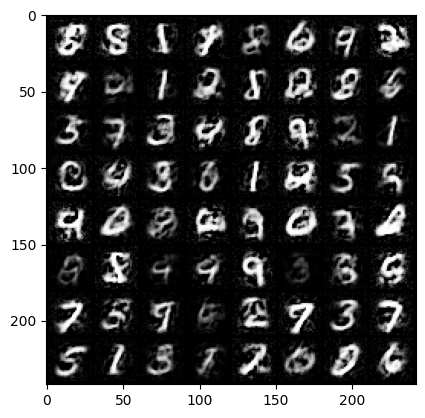

Epoch [33/80] Batch 0/938                   Loss D: 0.0630, Loss G: 0.3468
Epoch [33/80] Batch 100/938                   Loss D: -0.1101, Loss G: -0.1661
Epoch [33/80] Batch 200/938                   Loss D: -0.0632, Loss G: 0.3538
Epoch [33/80] Batch 300/938                   Loss D: 0.0084, Loss G: 0.0612
Epoch [33/80] Batch 400/938                   Loss D: 0.0714, Loss G: -0.3044
Epoch [33/80] Batch 500/938                   Loss D: -0.1036, Loss G: 0.0935
Epoch [33/80] Batch 600/938                   Loss D: -0.0143, Loss G: 0.0566
Epoch [33/80] Batch 700/938                   Loss D: 0.1140, Loss G: 0.5186
Epoch [33/80] Batch 800/938                   Loss D: -0.0583, Loss G: -0.2276
Epoch [33/80] Batch 900/938                   Loss D: -0.0753, Loss G: 0.0216


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.97174686..1.0].


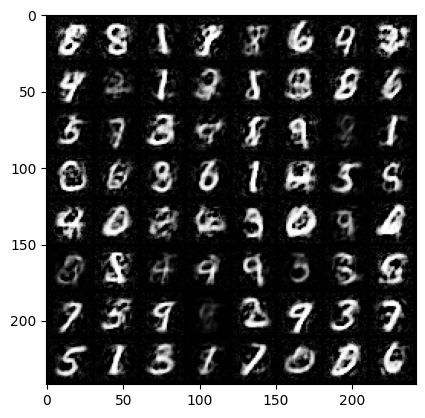

Epoch [34/80] Batch 0/938                   Loss D: -0.0066, Loss G: -0.2286
Epoch [34/80] Batch 100/938                   Loss D: -0.0616, Loss G: -0.3302
Epoch [34/80] Batch 200/938                   Loss D: 0.2209, Loss G: -0.1734
Epoch [34/80] Batch 300/938                   Loss D: -0.0183, Loss G: 0.0492
Epoch [34/80] Batch 400/938                   Loss D: 0.1060, Loss G: 0.2645
Epoch [34/80] Batch 500/938                   Loss D: -0.0726, Loss G: 0.2000
Epoch [34/80] Batch 600/938                   Loss D: 0.0325, Loss G: -0.5479
Epoch [34/80] Batch 700/938                   Loss D: -0.0809, Loss G: 0.3000
Epoch [34/80] Batch 800/938                   Loss D: 0.0700, Loss G: -0.1459
Epoch [34/80] Batch 900/938                   Loss D: -0.0502, Loss G: 0.2000


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9865698..0.999998].


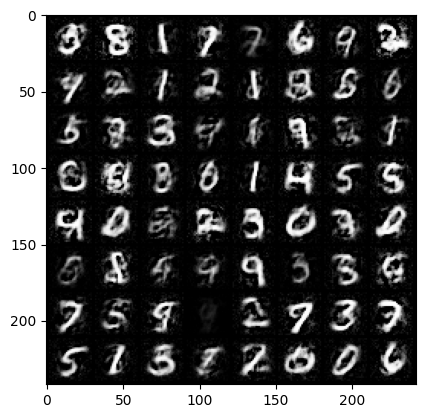

Epoch [35/80] Batch 0/938                   Loss D: 0.0154, Loss G: 0.1344
Epoch [35/80] Batch 100/938                   Loss D: -0.0014, Loss G: 0.0494
Epoch [35/80] Batch 200/938                   Loss D: -0.0890, Loss G: -0.2095
Epoch [35/80] Batch 300/938                   Loss D: -0.0251, Loss G: -0.3975
Epoch [35/80] Batch 400/938                   Loss D: -0.0086, Loss G: 0.3553
Epoch [35/80] Batch 500/938                   Loss D: -0.0024, Loss G: -0.1439
Epoch [35/80] Batch 600/938                   Loss D: 0.1009, Loss G: 0.3334
Epoch [35/80] Batch 700/938                   Loss D: -0.0880, Loss G: 0.2225
Epoch [35/80] Batch 800/938                   Loss D: -0.0817, Loss G: 0.4217
Epoch [35/80] Batch 900/938                   Loss D: 0.0484, Loss G: -0.2066


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.95643693..0.99999756].


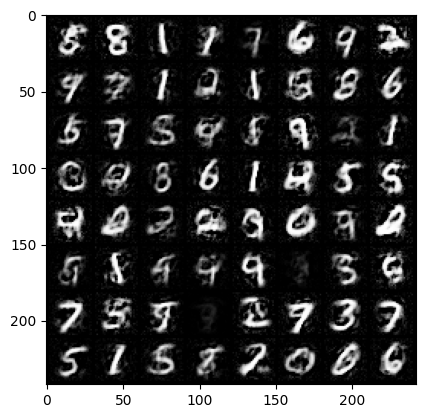

Epoch [36/80] Batch 0/938                   Loss D: 0.1026, Loss G: -0.3318
Epoch [36/80] Batch 100/938                   Loss D: 0.0899, Loss G: 0.3835
Epoch [36/80] Batch 200/938                   Loss D: 0.0828, Loss G: -0.4185
Epoch [36/80] Batch 300/938                   Loss D: -0.0231, Loss G: 0.2531
Epoch [36/80] Batch 400/938                   Loss D: 0.0085, Loss G: 0.0155
Epoch [36/80] Batch 500/938                   Loss D: -0.0512, Loss G: -0.3460
Epoch [36/80] Batch 600/938                   Loss D: -0.1003, Loss G: 0.4091
Epoch [36/80] Batch 700/938                   Loss D: 0.0127, Loss G: 0.0181
Epoch [36/80] Batch 800/938                   Loss D: -0.0416, Loss G: -0.3224
Epoch [36/80] Batch 900/938                   Loss D: 0.0019, Loss G: -0.0755


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9795896..0.99999994].


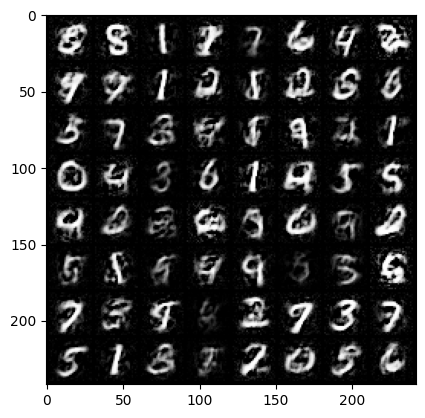

Epoch [37/80] Batch 0/938                   Loss D: -0.0280, Loss G: -0.3042
Epoch [37/80] Batch 100/938                   Loss D: -0.0311, Loss G: -0.5627
Epoch [37/80] Batch 200/938                   Loss D: -0.0468, Loss G: -0.1297
Epoch [37/80] Batch 300/938                   Loss D: -0.1018, Loss G: 0.2906
Epoch [37/80] Batch 400/938                   Loss D: -0.0102, Loss G: -0.0316
Epoch [37/80] Batch 500/938                   Loss D: -0.1619, Loss G: 0.2571
Epoch [37/80] Batch 600/938                   Loss D: 0.0524, Loss G: -0.1423
Epoch [37/80] Batch 700/938                   Loss D: 0.0072, Loss G: 0.0459
Epoch [37/80] Batch 800/938                   Loss D: -0.0552, Loss G: 0.1734
Epoch [37/80] Batch 900/938                   Loss D: -0.0319, Loss G: 0.2539


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9314529..0.99999917].


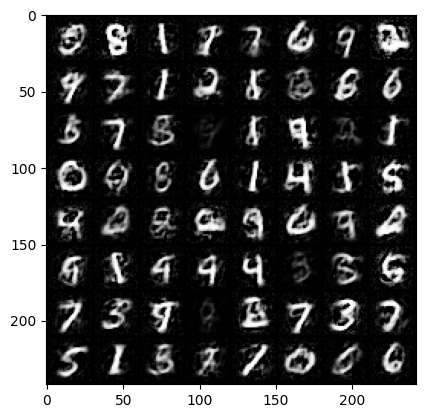

Epoch [38/80] Batch 0/938                   Loss D: -0.0875, Loss G: 0.3381
Epoch [38/80] Batch 100/938                   Loss D: -0.0728, Loss G: -0.0013
Epoch [38/80] Batch 200/938                   Loss D: 0.0607, Loss G: -0.1513
Epoch [38/80] Batch 300/938                   Loss D: 0.0667, Loss G: -0.2349
Epoch [38/80] Batch 400/938                   Loss D: 0.0514, Loss G: -0.2315
Epoch [38/80] Batch 500/938                   Loss D: -0.0469, Loss G: 0.1846
Epoch [38/80] Batch 600/938                   Loss D: -0.0947, Loss G: 0.0467
Epoch [38/80] Batch 700/938                   Loss D: -0.0793, Loss G: 0.1611
Epoch [38/80] Batch 800/938                   Loss D: 0.1027, Loss G: -0.2006
Epoch [38/80] Batch 900/938                   Loss D: -0.0796, Loss G: -0.2556


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.98654646..0.99999994].


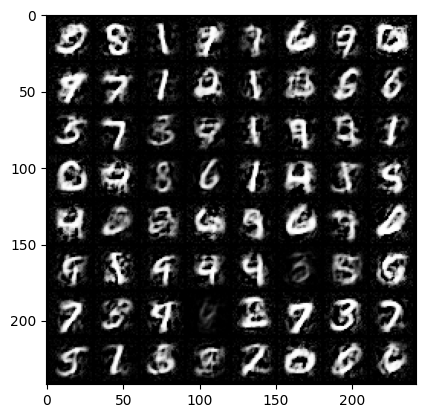

Epoch [39/80] Batch 0/938                   Loss D: 0.0376, Loss G: 0.1817
Epoch [39/80] Batch 100/938                   Loss D: -0.1493, Loss G: 0.0766
Epoch [39/80] Batch 200/938                   Loss D: -0.0491, Loss G: -0.0898
Epoch [39/80] Batch 300/938                   Loss D: 0.0623, Loss G: -0.2512
Epoch [39/80] Batch 400/938                   Loss D: -0.1074, Loss G: 0.1234
Epoch [39/80] Batch 500/938                   Loss D: 0.0759, Loss G: -0.2465
Epoch [39/80] Batch 600/938                   Loss D: -0.0943, Loss G: 0.4686
Epoch [39/80] Batch 700/938                   Loss D: -0.0638, Loss G: -0.0696
Epoch [39/80] Batch 800/938                   Loss D: 0.0534, Loss G: -0.1296
Epoch [39/80] Batch 900/938                   Loss D: -0.0748, Loss G: -0.2398


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9741247..0.99999386].


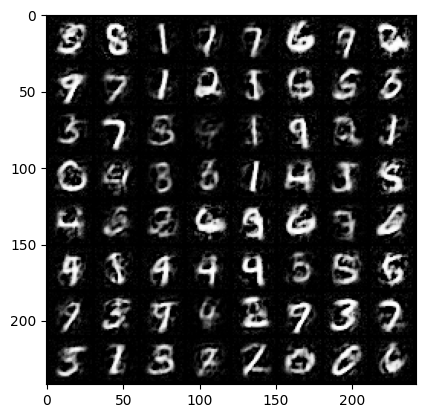

Epoch [40/80] Batch 0/938                   Loss D: -0.0500, Loss G: 0.2936
Epoch [40/80] Batch 100/938                   Loss D: -0.1086, Loss G: -0.1329
Epoch [40/80] Batch 200/938                   Loss D: -0.0370, Loss G: 0.1404
Epoch [40/80] Batch 300/938                   Loss D: 0.0211, Loss G: 0.4168
Epoch [40/80] Batch 400/938                   Loss D: -0.0389, Loss G: -0.0344
Epoch [40/80] Batch 500/938                   Loss D: 0.0445, Loss G: 0.0157
Epoch [40/80] Batch 600/938                   Loss D: -0.0108, Loss G: -0.1336
Epoch [40/80] Batch 700/938                   Loss D: -0.1915, Loss G: 0.1196
Epoch [40/80] Batch 800/938                   Loss D: -0.0578, Loss G: -0.1723
Epoch [40/80] Batch 900/938                   Loss D: -0.0140, Loss G: 0.1098


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9864095..0.9999996].


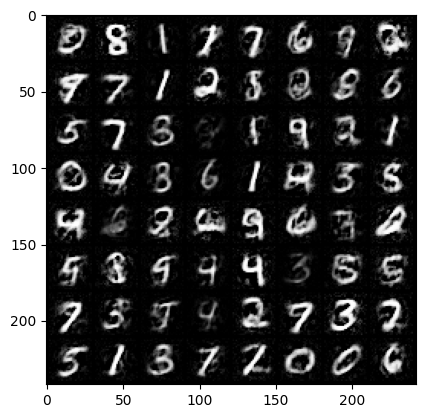

Epoch [41/80] Batch 0/938                   Loss D: -0.0266, Loss G: 0.1885
Epoch [41/80] Batch 100/938                   Loss D: -0.0978, Loss G: -0.0205
Epoch [41/80] Batch 200/938                   Loss D: -0.0259, Loss G: -0.0392
Epoch [41/80] Batch 300/938                   Loss D: -0.0170, Loss G: 0.4436
Epoch [41/80] Batch 400/938                   Loss D: -0.0648, Loss G: 0.2775
Epoch [41/80] Batch 500/938                   Loss D: 0.0663, Loss G: -0.1426
Epoch [41/80] Batch 600/938                   Loss D: 0.0001, Loss G: 0.0655
Epoch [41/80] Batch 700/938                   Loss D: -0.0305, Loss G: 0.2789
Epoch [41/80] Batch 800/938                   Loss D: 0.0767, Loss G: -0.1349
Epoch [41/80] Batch 900/938                   Loss D: 0.0431, Loss G: 0.1620


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99240553..0.9999995].


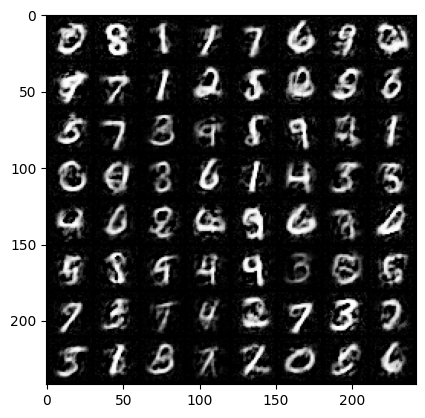

Epoch [42/80] Batch 0/938                   Loss D: -0.0591, Loss G: -0.0613
Epoch [42/80] Batch 100/938                   Loss D: 0.0846, Loss G: 0.2151
Epoch [42/80] Batch 200/938                   Loss D: -0.0189, Loss G: 0.0958
Epoch [42/80] Batch 300/938                   Loss D: -0.0310, Loss G: 0.2827
Epoch [42/80] Batch 400/938                   Loss D: -0.0791, Loss G: 0.1138
Epoch [42/80] Batch 500/938                   Loss D: 0.0962, Loss G: 0.0922
Epoch [42/80] Batch 600/938                   Loss D: 0.0551, Loss G: 0.0369
Epoch [42/80] Batch 700/938                   Loss D: -0.0037, Loss G: 0.1707
Epoch [42/80] Batch 800/938                   Loss D: 0.0196, Loss G: 0.3121
Epoch [42/80] Batch 900/938                   Loss D: 0.0066, Loss G: 0.3246


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9607758..0.99999815].


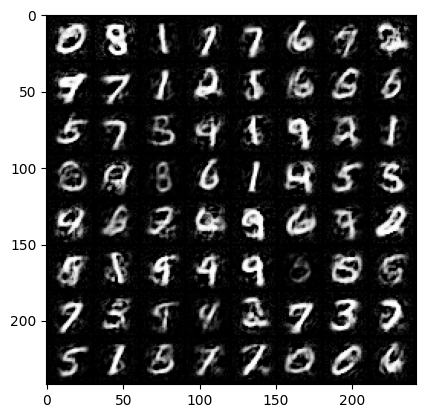

Epoch [43/80] Batch 0/938                   Loss D: 0.0217, Loss G: -0.0290
Epoch [43/80] Batch 100/938                   Loss D: -0.0540, Loss G: 0.1341
Epoch [43/80] Batch 200/938                   Loss D: 0.1249, Loss G: -0.4443
Epoch [43/80] Batch 300/938                   Loss D: -0.1091, Loss G: 0.0591
Epoch [43/80] Batch 400/938                   Loss D: -0.0372, Loss G: 0.2828
Epoch [43/80] Batch 500/938                   Loss D: -0.1534, Loss G: 0.3204
Epoch [43/80] Batch 600/938                   Loss D: 0.1379, Loss G: -0.0825
Epoch [43/80] Batch 700/938                   Loss D: -0.0848, Loss G: 0.0413
Epoch [43/80] Batch 800/938                   Loss D: -0.0185, Loss G: 0.2321
Epoch [43/80] Batch 900/938                   Loss D: -0.0832, Loss G: 0.3491


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9810751..0.9999993].


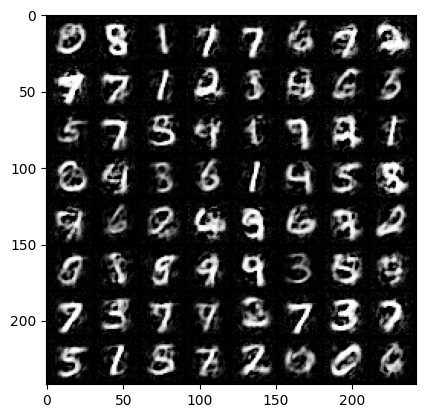

Epoch [44/80] Batch 0/938                   Loss D: 0.0540, Loss G: 0.0729
Epoch [44/80] Batch 100/938                   Loss D: 0.0580, Loss G: 0.1043
Epoch [44/80] Batch 200/938                   Loss D: 0.0137, Loss G: -0.3136
Epoch [44/80] Batch 300/938                   Loss D: 0.0292, Loss G: 0.1172
Epoch [44/80] Batch 400/938                   Loss D: 0.0237, Loss G: 0.0843
Epoch [44/80] Batch 500/938                   Loss D: 0.0749, Loss G: -0.1723
Epoch [44/80] Batch 600/938                   Loss D: -0.1022, Loss G: 0.2160
Epoch [44/80] Batch 700/938                   Loss D: 0.0026, Loss G: -0.3308
Epoch [44/80] Batch 800/938                   Loss D: -0.0356, Loss G: 0.3128
Epoch [44/80] Batch 900/938                   Loss D: 0.0288, Loss G: -0.3331


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9660866..0.99999964].


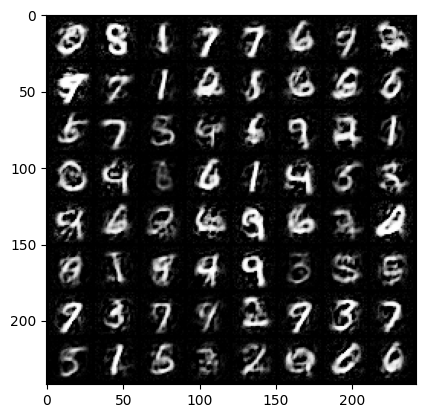

Epoch [45/80] Batch 0/938                   Loss D: 0.0572, Loss G: -0.0668
Epoch [45/80] Batch 100/938                   Loss D: -0.1314, Loss G: -0.3364
Epoch [45/80] Batch 200/938                   Loss D: -0.0123, Loss G: -0.1590
Epoch [45/80] Batch 300/938                   Loss D: -0.0977, Loss G: 0.1991
Epoch [45/80] Batch 400/938                   Loss D: -0.0273, Loss G: -0.2194
Epoch [45/80] Batch 500/938                   Loss D: -0.0679, Loss G: -0.0781
Epoch [45/80] Batch 600/938                   Loss D: 0.0218, Loss G: -0.1434
Epoch [45/80] Batch 700/938                   Loss D: -0.0707, Loss G: 0.0105
Epoch [45/80] Batch 800/938                   Loss D: -0.0330, Loss G: 0.1093
Epoch [45/80] Batch 900/938                   Loss D: 0.0210, Loss G: 0.0091


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9012128..0.99999994].


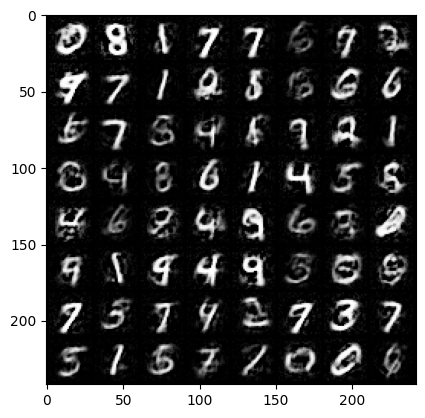

Epoch [46/80] Batch 0/938                   Loss D: -0.0143, Loss G: -0.0791
Epoch [46/80] Batch 100/938                   Loss D: 0.0318, Loss G: -0.1587
Epoch [46/80] Batch 200/938                   Loss D: 0.0627, Loss G: 0.1206
Epoch [46/80] Batch 300/938                   Loss D: -0.0728, Loss G: 0.0893
Epoch [46/80] Batch 400/938                   Loss D: -0.2142, Loss G: 0.3378
Epoch [46/80] Batch 500/938                   Loss D: -0.0977, Loss G: 0.3809
Epoch [46/80] Batch 600/938                   Loss D: -0.0085, Loss G: 0.0633
Epoch [46/80] Batch 700/938                   Loss D: -0.0448, Loss G: 0.0215
Epoch [46/80] Batch 800/938                   Loss D: 0.0587, Loss G: 0.0960
Epoch [46/80] Batch 900/938                   Loss D: -0.0929, Loss G: -0.1527


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9434077..0.99999994].


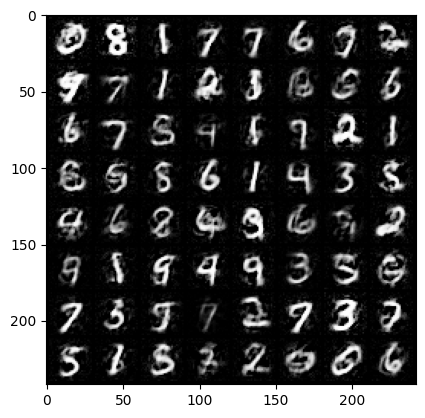

Epoch [47/80] Batch 0/938                   Loss D: 0.0159, Loss G: -0.1662
Epoch [47/80] Batch 100/938                   Loss D: -0.0232, Loss G: -0.3874
Epoch [47/80] Batch 200/938                   Loss D: -0.0011, Loss G: 0.4026
Epoch [47/80] Batch 300/938                   Loss D: 0.0971, Loss G: -0.2965
Epoch [47/80] Batch 400/938                   Loss D: 0.0539, Loss G: -0.0135
Epoch [47/80] Batch 500/938                   Loss D: -0.0436, Loss G: 0.3547
Epoch [47/80] Batch 600/938                   Loss D: -0.0258, Loss G: 0.1659
Epoch [47/80] Batch 700/938                   Loss D: -0.0012, Loss G: -0.3427
Epoch [47/80] Batch 800/938                   Loss D: -0.0139, Loss G: -0.2924
Epoch [47/80] Batch 900/938                   Loss D: -0.0519, Loss G: 0.2607


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9230292..1.0].


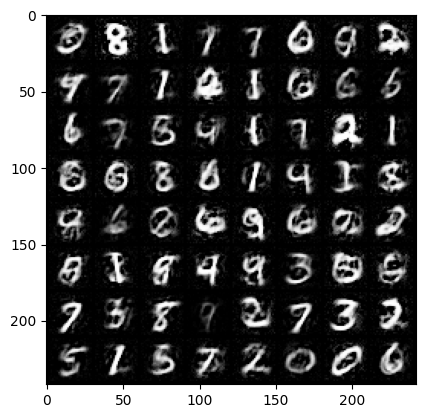

Epoch [48/80] Batch 0/938                   Loss D: -0.0164, Loss G: -0.3211
Epoch [48/80] Batch 100/938                   Loss D: -0.0238, Loss G: 0.0061
Epoch [48/80] Batch 200/938                   Loss D: -0.0175, Loss G: 0.1448
Epoch [48/80] Batch 300/938                   Loss D: -0.0441, Loss G: 0.2362
Epoch [48/80] Batch 400/938                   Loss D: 0.0370, Loss G: 0.2038
Epoch [48/80] Batch 500/938                   Loss D: -0.1019, Loss G: 0.3258
Epoch [48/80] Batch 600/938                   Loss D: -0.0182, Loss G: 0.3580
Epoch [48/80] Batch 700/938                   Loss D: -0.0284, Loss G: 0.0935
Epoch [48/80] Batch 800/938                   Loss D: 0.0753, Loss G: -0.1086
Epoch [48/80] Batch 900/938                   Loss D: 0.0243, Loss G: -0.0380


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.97377187..1.0].


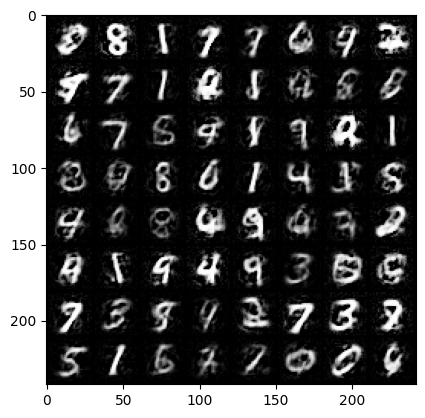

Epoch [49/80] Batch 0/938                   Loss D: -0.0715, Loss G: 0.1602
Epoch [49/80] Batch 100/938                   Loss D: -0.0475, Loss G: -0.0656
Epoch [49/80] Batch 200/938                   Loss D: -0.0013, Loss G: -0.1813
Epoch [49/80] Batch 300/938                   Loss D: -0.0229, Loss G: 0.1514
Epoch [49/80] Batch 400/938                   Loss D: -0.0048, Loss G: -0.0289
Epoch [49/80] Batch 500/938                   Loss D: 0.0282, Loss G: -0.1612
Epoch [49/80] Batch 600/938                   Loss D: -0.0298, Loss G: 0.1908
Epoch [49/80] Batch 700/938                   Loss D: -0.0382, Loss G: -0.1739
Epoch [49/80] Batch 800/938                   Loss D: -0.0679, Loss G: 0.3404
Epoch [49/80] Batch 900/938                   Loss D: -0.0154, Loss G: 0.3393


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9563763..0.9999999].


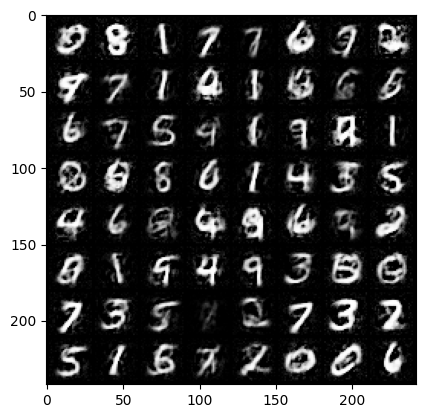

Epoch [50/80] Batch 0/938                   Loss D: -0.1138, Loss G: 0.1561
Epoch [50/80] Batch 100/938                   Loss D: -0.0450, Loss G: 0.1347
Epoch [50/80] Batch 200/938                   Loss D: 0.0352, Loss G: -0.0139
Epoch [50/80] Batch 300/938                   Loss D: -0.0207, Loss G: -0.0060
Epoch [50/80] Batch 400/938                   Loss D: -0.1222, Loss G: 0.3023
Epoch [50/80] Batch 500/938                   Loss D: 0.0234, Loss G: 0.0793
Epoch [50/80] Batch 600/938                   Loss D: 0.0050, Loss G: 0.1971
Epoch [50/80] Batch 700/938                   Loss D: 0.0090, Loss G: 0.3035
Epoch [50/80] Batch 800/938                   Loss D: 0.0851, Loss G: -0.0908
Epoch [50/80] Batch 900/938                   Loss D: 0.1021, Loss G: 0.0369


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9926083..1.0].


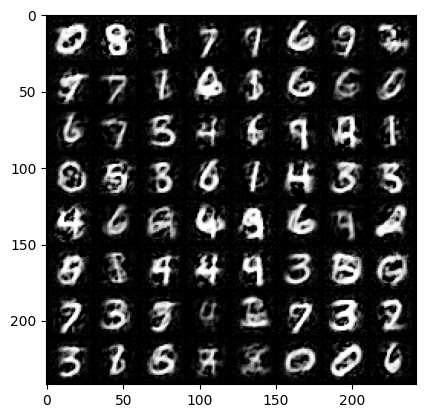

Epoch [51/80] Batch 0/938                   Loss D: -0.1504, Loss G: 0.3735
Epoch [51/80] Batch 100/938                   Loss D: -0.0213, Loss G: 0.1471
Epoch [51/80] Batch 200/938                   Loss D: 0.0301, Loss G: 0.0360
Epoch [51/80] Batch 300/938                   Loss D: -0.0141, Loss G: 0.1765
Epoch [51/80] Batch 400/938                   Loss D: -0.0850, Loss G: -0.0662
Epoch [51/80] Batch 500/938                   Loss D: -0.1042, Loss G: 0.2178
Epoch [51/80] Batch 600/938                   Loss D: -0.0615, Loss G: 0.1623
Epoch [51/80] Batch 700/938                   Loss D: -0.0310, Loss G: 0.0809
Epoch [51/80] Batch 800/938                   Loss D: 0.0155, Loss G: 0.0707
Epoch [51/80] Batch 900/938                   Loss D: -0.0754, Loss G: 0.1203


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.95692945..1.0].


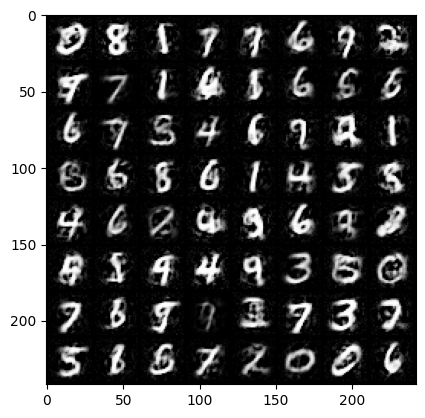

Epoch [52/80] Batch 0/938                   Loss D: -0.0147, Loss G: -0.1157
Epoch [52/80] Batch 100/938                   Loss D: 0.0548, Loss G: -0.1131
Epoch [52/80] Batch 200/938                   Loss D: -0.0184, Loss G: 0.0566
Epoch [52/80] Batch 300/938                   Loss D: 0.0083, Loss G: 0.2404
Epoch [52/80] Batch 400/938                   Loss D: -0.0722, Loss G: 0.1797
Epoch [52/80] Batch 500/938                   Loss D: 0.1058, Loss G: 0.1209
Epoch [52/80] Batch 600/938                   Loss D: 0.0405, Loss G: 0.1487
Epoch [52/80] Batch 700/938                   Loss D: -0.0318, Loss G: -0.1269
Epoch [52/80] Batch 800/938                   Loss D: 0.0493, Loss G: -0.4482
Epoch [52/80] Batch 900/938                   Loss D: 0.0172, Loss G: -0.2246


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.95418155..0.9999995].


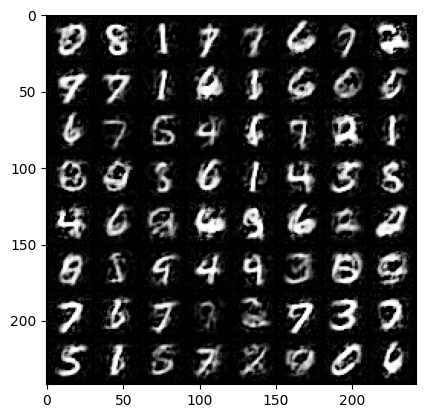

Epoch [53/80] Batch 0/938                   Loss D: 0.0136, Loss G: -0.0204
Epoch [53/80] Batch 100/938                   Loss D: 0.0036, Loss G: -0.1054
Epoch [53/80] Batch 200/938                   Loss D: -0.0352, Loss G: 0.1747
Epoch [53/80] Batch 300/938                   Loss D: -0.0210, Loss G: -0.1645
Epoch [53/80] Batch 400/938                   Loss D: -0.0115, Loss G: 0.0513
Epoch [53/80] Batch 500/938                   Loss D: 0.0012, Loss G: -0.2194
Epoch [53/80] Batch 600/938                   Loss D: 0.0406, Loss G: -0.0243
Epoch [53/80] Batch 700/938                   Loss D: 0.0048, Loss G: -0.1073
Epoch [53/80] Batch 800/938                   Loss D: -0.0180, Loss G: 0.2637
Epoch [53/80] Batch 900/938                   Loss D: -0.0025, Loss G: -0.0705


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.8856432..0.9999992].


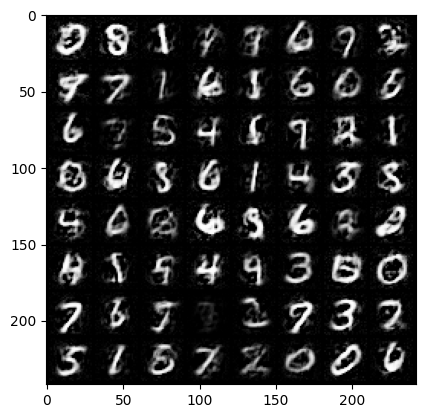

Epoch [54/80] Batch 0/938                   Loss D: 0.0611, Loss G: 0.1705
Epoch [54/80] Batch 100/938                   Loss D: -0.0656, Loss G: 0.0448
Epoch [54/80] Batch 200/938                   Loss D: -0.0175, Loss G: 0.0399
Epoch [54/80] Batch 300/938                   Loss D: -0.0425, Loss G: -0.0664
Epoch [54/80] Batch 400/938                   Loss D: 0.0512, Loss G: -0.1906
Epoch [54/80] Batch 500/938                   Loss D: -0.0124, Loss G: -0.1772
Epoch [54/80] Batch 600/938                   Loss D: -0.0342, Loss G: 0.0846
Epoch [54/80] Batch 700/938                   Loss D: -0.0338, Loss G: 0.2338
Epoch [54/80] Batch 800/938                   Loss D: 0.0240, Loss G: -0.1588
Epoch [54/80] Batch 900/938                   Loss D: 0.0174, Loss G: -0.0386


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.92453986..0.9999963].


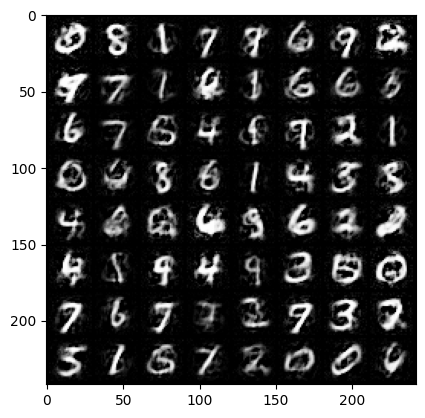

Epoch [55/80] Batch 0/938                   Loss D: -0.0235, Loss G: -0.0023
Epoch [55/80] Batch 100/938                   Loss D: -0.0088, Loss G: 0.1352
Epoch [55/80] Batch 200/938                   Loss D: -0.0091, Loss G: -0.0826
Epoch [55/80] Batch 300/938                   Loss D: -0.0050, Loss G: -0.0865
Epoch [55/80] Batch 400/938                   Loss D: 0.0099, Loss G: -0.1182
Epoch [55/80] Batch 500/938                   Loss D: -0.0045, Loss G: -0.0496
Epoch [55/80] Batch 600/938                   Loss D: 0.0190, Loss G: 0.0293
Epoch [55/80] Batch 700/938                   Loss D: -0.0150, Loss G: -0.0083
Epoch [55/80] Batch 800/938                   Loss D: -0.0210, Loss G: -0.0779
Epoch [55/80] Batch 900/938                   Loss D: -0.0108, Loss G: -0.0435


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9734235..0.9999794].


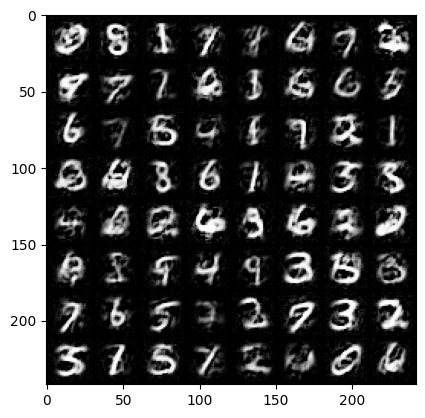

Epoch [56/80] Batch 0/938                   Loss D: 0.0240, Loss G: -0.1404
Epoch [56/80] Batch 100/938                   Loss D: -0.0074, Loss G: -0.0492
Epoch [56/80] Batch 200/938                   Loss D: -0.0182, Loss G: -0.1896
Epoch [56/80] Batch 300/938                   Loss D: 0.0179, Loss G: -0.1585
Epoch [56/80] Batch 400/938                   Loss D: -0.0201, Loss G: 0.1131
Epoch [56/80] Batch 500/938                   Loss D: 0.0089, Loss G: 0.0667
Epoch [56/80] Batch 600/938                   Loss D: -0.0171, Loss G: -0.0594
Epoch [56/80] Batch 700/938                   Loss D: -0.0094, Loss G: 0.0110
Epoch [56/80] Batch 800/938                   Loss D: 0.0031, Loss G: -0.0020
Epoch [56/80] Batch 900/938                   Loss D: 0.0212, Loss G: -0.0019


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.91274124..0.9998944].


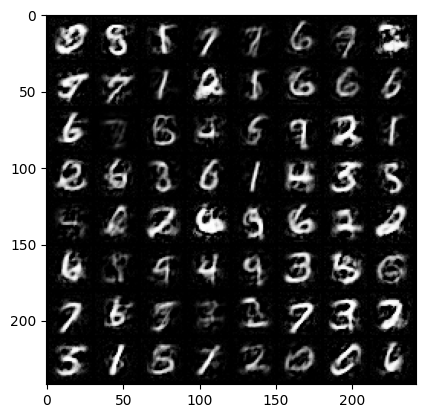

Epoch [57/80] Batch 0/938                   Loss D: 0.0001, Loss G: -0.0409
Epoch [57/80] Batch 100/938                   Loss D: -0.0274, Loss G: 0.0098
Epoch [57/80] Batch 200/938                   Loss D: 0.0328, Loss G: -0.0039
Epoch [57/80] Batch 300/938                   Loss D: 0.0086, Loss G: -0.1155
Epoch [57/80] Batch 400/938                   Loss D: -0.0342, Loss G: -0.0611
Epoch [57/80] Batch 500/938                   Loss D: -0.0034, Loss G: 0.0293
Epoch [57/80] Batch 600/938                   Loss D: 0.0164, Loss G: -0.0065
Epoch [57/80] Batch 700/938                   Loss D: -0.0369, Loss G: -0.0635
Epoch [57/80] Batch 800/938                   Loss D: -0.0123, Loss G: 0.0490
Epoch [57/80] Batch 900/938                   Loss D: -0.0140, Loss G: 0.0952


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.91348433..0.9999705].


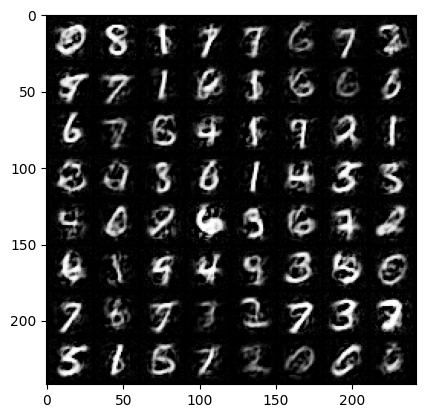

Epoch [58/80] Batch 0/938                   Loss D: -0.0216, Loss G: -0.1133
Epoch [58/80] Batch 100/938                   Loss D: -0.0400, Loss G: 0.0423
Epoch [58/80] Batch 200/938                   Loss D: -0.0452, Loss G: 0.1073
Epoch [58/80] Batch 300/938                   Loss D: 0.0038, Loss G: -0.1534
Epoch [58/80] Batch 400/938                   Loss D: -0.0183, Loss G: 0.0204
Epoch [58/80] Batch 500/938                   Loss D: -0.0020, Loss G: -0.0635
Epoch [58/80] Batch 600/938                   Loss D: -0.0365, Loss G: 0.0455
Epoch [58/80] Batch 700/938                   Loss D: 0.0116, Loss G: -0.0127
Epoch [58/80] Batch 800/938                   Loss D: 0.0455, Loss G: 0.0294
Epoch [58/80] Batch 900/938                   Loss D: -0.0345, Loss G: 0.0312


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9582855..0.99999905].


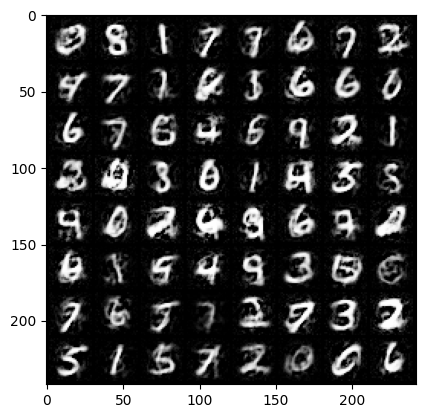

Epoch [59/80] Batch 0/938                   Loss D: 0.0098, Loss G: -0.0679
Epoch [59/80] Batch 100/938                   Loss D: -0.0034, Loss G: -0.0106
Epoch [59/80] Batch 200/938                   Loss D: -0.0144, Loss G: -0.0338
Epoch [59/80] Batch 300/938                   Loss D: 0.0279, Loss G: -0.0168
Epoch [59/80] Batch 400/938                   Loss D: 0.0179, Loss G: 0.0242
Epoch [59/80] Batch 500/938                   Loss D: 0.0205, Loss G: -0.0046
Epoch [59/80] Batch 600/938                   Loss D: -0.0395, Loss G: 0.0461
Epoch [59/80] Batch 700/938                   Loss D: 0.0001, Loss G: -0.0275
Epoch [59/80] Batch 800/938                   Loss D: -0.0123, Loss G: -0.0491
Epoch [59/80] Batch 900/938                   Loss D: 0.0501, Loss G: -0.0514


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9522403..0.99999976].


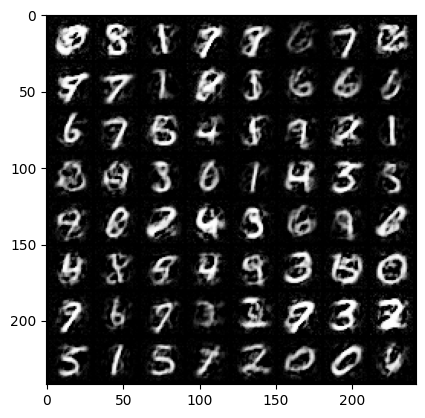

Epoch [60/80] Batch 0/938                   Loss D: -0.0229, Loss G: -0.0101
Epoch [60/80] Batch 100/938                   Loss D: 0.0039, Loss G: -0.1257
Epoch [60/80] Batch 200/938                   Loss D: 0.0221, Loss G: 0.0474
Epoch [60/80] Batch 300/938                   Loss D: -0.0067, Loss G: 0.0291
Epoch [60/80] Batch 400/938                   Loss D: 0.0011, Loss G: -0.0309
Epoch [60/80] Batch 500/938                   Loss D: -0.0091, Loss G: -0.0320
Epoch [60/80] Batch 600/938                   Loss D: -0.0201, Loss G: 0.0129
Epoch [60/80] Batch 700/938                   Loss D: 0.0139, Loss G: -0.0363
Epoch [60/80] Batch 800/938                   Loss D: -0.0028, Loss G: -0.0121
Epoch [60/80] Batch 900/938                   Loss D: -0.0203, Loss G: 0.1051


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.94523096..0.9999999].


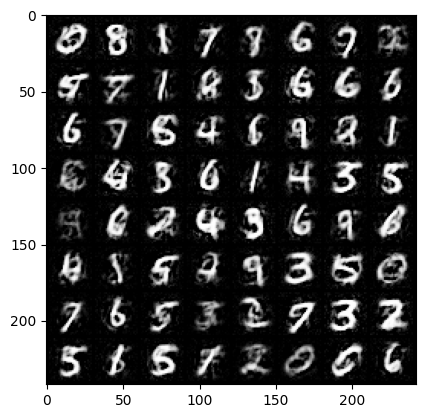

Epoch [61/80] Batch 0/938                   Loss D: 0.0509, Loss G: 0.1252
Epoch [61/80] Batch 100/938                   Loss D: -0.0147, Loss G: -0.0310
Epoch [61/80] Batch 200/938                   Loss D: -0.0228, Loss G: -0.0094
Epoch [61/80] Batch 300/938                   Loss D: 0.0073, Loss G: -0.0187
Epoch [61/80] Batch 400/938                   Loss D: -0.0187, Loss G: -0.0195
Epoch [61/80] Batch 500/938                   Loss D: -0.0137, Loss G: 0.0818
Epoch [61/80] Batch 600/938                   Loss D: -0.0076, Loss G: 0.0448
Epoch [61/80] Batch 700/938                   Loss D: -0.0022, Loss G: 0.0017
Epoch [61/80] Batch 800/938                   Loss D: 0.0092, Loss G: 0.0453
Epoch [61/80] Batch 900/938                   Loss D: -0.0325, Loss G: -0.0350


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9238491..0.9999992].


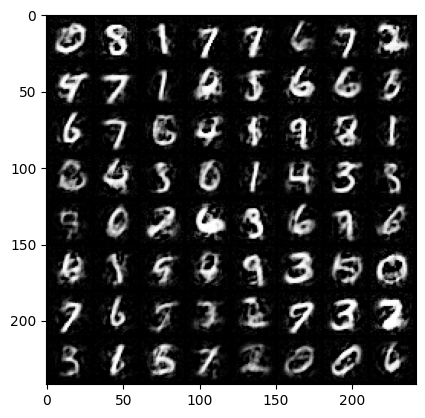

Epoch [62/80] Batch 0/938                   Loss D: 0.0011, Loss G: 0.0928
Epoch [62/80] Batch 100/938                   Loss D: 0.0127, Loss G: 0.0420
Epoch [62/80] Batch 200/938                   Loss D: -0.0125, Loss G: 0.0220
Epoch [62/80] Batch 300/938                   Loss D: 0.0065, Loss G: 0.0612
Epoch [62/80] Batch 400/938                   Loss D: -0.0041, Loss G: -0.0484
Epoch [62/80] Batch 500/938                   Loss D: 0.0081, Loss G: -0.0187
Epoch [62/80] Batch 600/938                   Loss D: -0.0243, Loss G: -0.0376
Epoch [62/80] Batch 700/938                   Loss D: -0.0010, Loss G: 0.0252
Epoch [62/80] Batch 800/938                   Loss D: 0.0204, Loss G: -0.0195
Epoch [62/80] Batch 900/938                   Loss D: -0.0205, Loss G: 0.0447


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9771299..0.99999976].


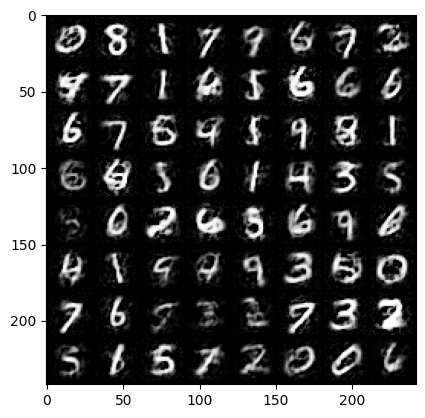

Epoch [63/80] Batch 0/938                   Loss D: 0.0270, Loss G: 0.0756
Epoch [63/80] Batch 100/938                   Loss D: -0.0199, Loss G: 0.1410
Epoch [63/80] Batch 200/938                   Loss D: -0.0182, Loss G: -0.0776
Epoch [63/80] Batch 300/938                   Loss D: -0.0076, Loss G: 0.0181
Epoch [63/80] Batch 400/938                   Loss D: 0.0543, Loss G: 0.0368
Epoch [63/80] Batch 500/938                   Loss D: 0.0078, Loss G: 0.0621
Epoch [63/80] Batch 600/938                   Loss D: -0.0030, Loss G: -0.0134
Epoch [63/80] Batch 700/938                   Loss D: 0.0281, Loss G: -0.0281
Epoch [63/80] Batch 800/938                   Loss D: -0.0067, Loss G: 0.0374
Epoch [63/80] Batch 900/938                   Loss D: 0.0175, Loss G: -0.0101


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.94593894..0.99999934].


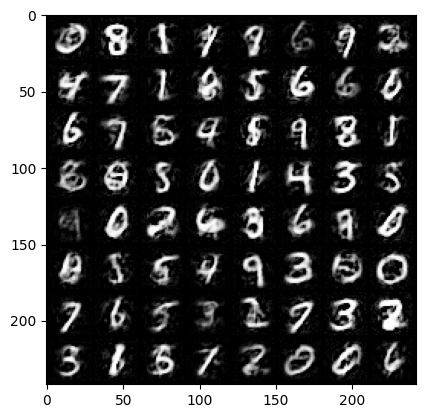

Epoch [64/80] Batch 0/938                   Loss D: 0.0012, Loss G: 0.0070
Epoch [64/80] Batch 100/938                   Loss D: 0.0080, Loss G: -0.0320
Epoch [64/80] Batch 200/938                   Loss D: 0.0000, Loss G: 0.0496
Epoch [64/80] Batch 300/938                   Loss D: -0.0011, Loss G: -0.0398
Epoch [64/80] Batch 400/938                   Loss D: 0.0080, Loss G: 0.0033
Epoch [64/80] Batch 500/938                   Loss D: -0.0012, Loss G: -0.0066
Epoch [64/80] Batch 600/938                   Loss D: 0.0155, Loss G: 0.0536
Epoch [64/80] Batch 700/938                   Loss D: -0.0226, Loss G: 0.0233
Epoch [64/80] Batch 800/938                   Loss D: -0.0042, Loss G: 0.0183
Epoch [64/80] Batch 900/938                   Loss D: 0.0101, Loss G: -0.0111


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.93861175..0.99999994].


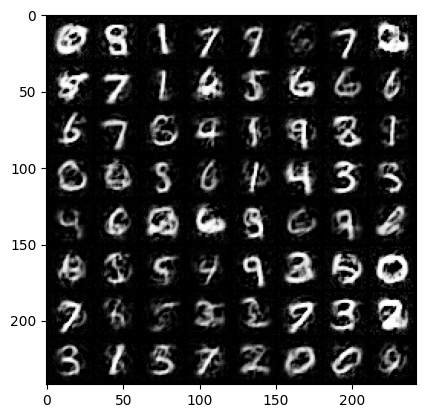

Epoch [65/80] Batch 0/938                   Loss D: 0.0206, Loss G: -0.0323
Epoch [65/80] Batch 100/938                   Loss D: 0.0429, Loss G: 0.0205
Epoch [65/80] Batch 200/938                   Loss D: -0.0087, Loss G: -0.0040
Epoch [65/80] Batch 300/938                   Loss D: 0.0016, Loss G: 0.0161
Epoch [65/80] Batch 400/938                   Loss D: 0.0188, Loss G: -0.0145
Epoch [65/80] Batch 500/938                   Loss D: -0.0034, Loss G: -0.0414
Epoch [65/80] Batch 600/938                   Loss D: 0.0025, Loss G: 0.0278
Epoch [65/80] Batch 700/938                   Loss D: -0.0095, Loss G: 0.0063
Epoch [65/80] Batch 800/938                   Loss D: 0.0002, Loss G: -0.0442
Epoch [65/80] Batch 900/938                   Loss D: -0.0122, Loss G: -0.0116


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.944944..0.999999].


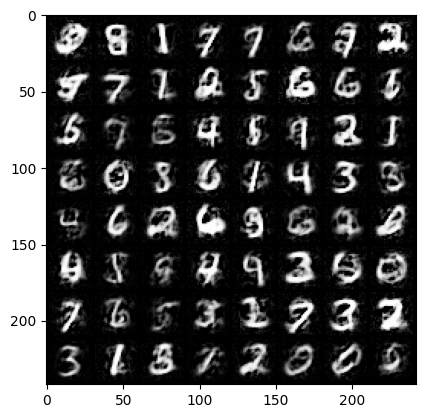

Epoch [66/80] Batch 0/938                   Loss D: -0.0132, Loss G: -0.0080
Epoch [66/80] Batch 100/938                   Loss D: -0.0046, Loss G: 0.0183
Epoch [66/80] Batch 200/938                   Loss D: -0.0085, Loss G: 0.0045
Epoch [66/80] Batch 300/938                   Loss D: 0.0080, Loss G: 0.0351
Epoch [66/80] Batch 400/938                   Loss D: -0.0054, Loss G: -0.0334
Epoch [66/80] Batch 500/938                   Loss D: 0.0106, Loss G: -0.0163
Epoch [66/80] Batch 600/938                   Loss D: -0.0037, Loss G: -0.0127
Epoch [66/80] Batch 700/938                   Loss D: -0.0069, Loss G: 0.0475
Epoch [66/80] Batch 800/938                   Loss D: -0.0053, Loss G: -0.0176
Epoch [66/80] Batch 900/938                   Loss D: -0.0063, Loss G: -0.0092


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.95544016..0.9999995].


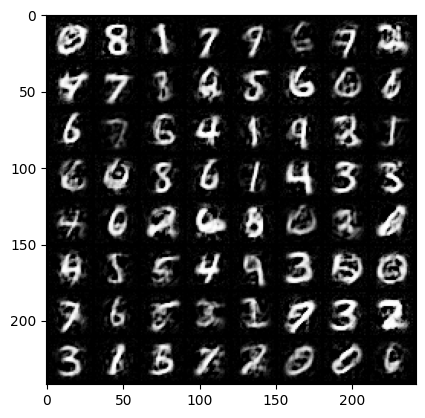

Epoch [67/80] Batch 0/938                   Loss D: 0.0027, Loss G: -0.0029
Epoch [67/80] Batch 100/938                   Loss D: 0.0040, Loss G: 0.0334
Epoch [67/80] Batch 200/938                   Loss D: -0.0020, Loss G: -0.0174
Epoch [67/80] Batch 300/938                   Loss D: 0.0012, Loss G: 0.0373
Epoch [67/80] Batch 400/938                   Loss D: -0.0007, Loss G: -0.0178
Epoch [67/80] Batch 500/938                   Loss D: -0.0004, Loss G: -0.0218
Epoch [67/80] Batch 600/938                   Loss D: -0.0123, Loss G: -0.0300
Epoch [67/80] Batch 700/938                   Loss D: -0.0085, Loss G: -0.0004
Epoch [67/80] Batch 800/938                   Loss D: -0.0010, Loss G: -0.0002
Epoch [67/80] Batch 900/938                   Loss D: -0.0144, Loss G: -0.0131


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.964208..1.0].


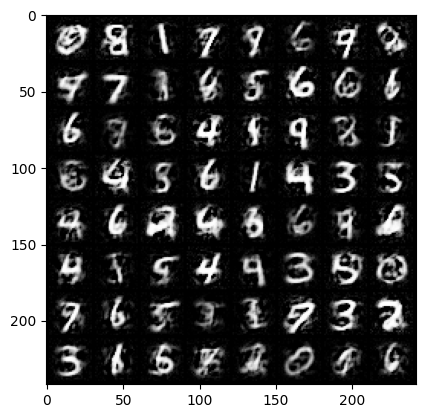

Epoch [68/80] Batch 0/938                   Loss D: -0.0124, Loss G: 0.0288
Epoch [68/80] Batch 100/938                   Loss D: -0.0073, Loss G: 0.0101
Epoch [68/80] Batch 200/938                   Loss D: -0.0013, Loss G: -0.0081
Epoch [68/80] Batch 300/938                   Loss D: -0.0061, Loss G: -0.0102
Epoch [68/80] Batch 400/938                   Loss D: 0.0053, Loss G: -0.0021
Epoch [68/80] Batch 500/938                   Loss D: -0.0086, Loss G: 0.0170
Epoch [68/80] Batch 600/938                   Loss D: -0.0020, Loss G: -0.0163
Epoch [68/80] Batch 700/938                   Loss D: -0.0090, Loss G: 0.0220
Epoch [68/80] Batch 800/938                   Loss D: 0.0021, Loss G: 0.0275
Epoch [68/80] Batch 900/938                   Loss D: -0.0049, Loss G: 0.0286


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9573808..0.9999987].


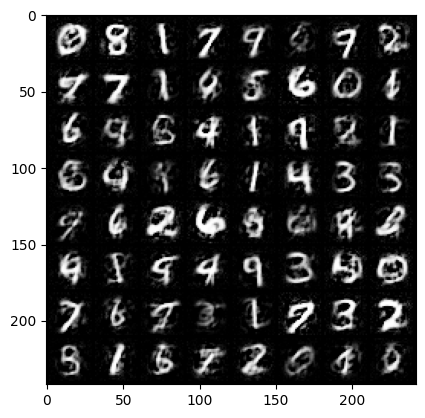

Epoch [69/80] Batch 0/938                   Loss D: -0.0067, Loss G: -0.0087
Epoch [69/80] Batch 100/938                   Loss D: 0.0031, Loss G: 0.0023
Epoch [69/80] Batch 200/938                   Loss D: 0.0034, Loss G: -0.0048
Epoch [69/80] Batch 300/938                   Loss D: -0.0066, Loss G: 0.0349
Epoch [69/80] Batch 400/938                   Loss D: 0.0014, Loss G: -0.0180
Epoch [69/80] Batch 500/938                   Loss D: -0.0010, Loss G: 0.0141
Epoch [69/80] Batch 600/938                   Loss D: -0.0018, Loss G: 0.0262
Epoch [69/80] Batch 700/938                   Loss D: -0.0059, Loss G: 0.0126
Epoch [69/80] Batch 800/938                   Loss D: -0.0078, Loss G: -0.0245
Epoch [69/80] Batch 900/938                   Loss D: -0.0013, Loss G: -0.0016


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9662042..0.9999978].


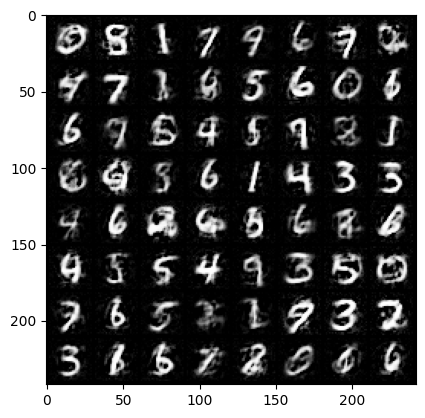

Epoch [70/80] Batch 0/938                   Loss D: -0.0032, Loss G: -0.0058
Epoch [70/80] Batch 100/938                   Loss D: 0.0058, Loss G: 0.0106
Epoch [70/80] Batch 200/938                   Loss D: 0.0011, Loss G: 0.0041
Epoch [70/80] Batch 300/938                   Loss D: -0.0068, Loss G: 0.0254
Epoch [70/80] Batch 400/938                   Loss D: -0.0015, Loss G: -0.0058
Epoch [70/80] Batch 500/938                   Loss D: 0.0027, Loss G: 0.0019
Epoch [70/80] Batch 600/938                   Loss D: 0.0008, Loss G: 0.0053
Epoch [70/80] Batch 700/938                   Loss D: -0.0017, Loss G: -0.0232
Epoch [70/80] Batch 800/938                   Loss D: -0.0066, Loss G: -0.0201
Epoch [70/80] Batch 900/938                   Loss D: -0.0045, Loss G: -0.0247


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9885183..0.9999988].


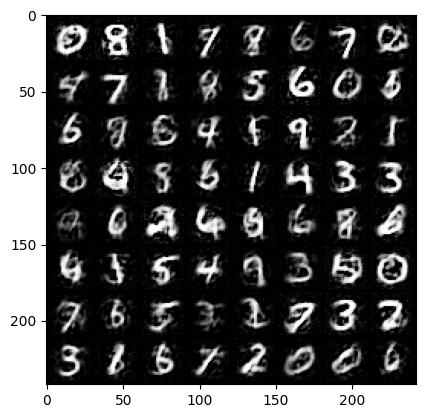

Epoch [71/80] Batch 0/938                   Loss D: -0.0107, Loss G: 0.0028
Epoch [71/80] Batch 100/938                   Loss D: 0.0096, Loss G: -0.0163
Epoch [71/80] Batch 200/938                   Loss D: 0.0002, Loss G: -0.0073
Epoch [71/80] Batch 300/938                   Loss D: -0.0100, Loss G: 0.0623
Epoch [71/80] Batch 400/938                   Loss D: 0.0052, Loss G: -0.0071
Epoch [71/80] Batch 500/938                   Loss D: -0.0053, Loss G: -0.0139
Epoch [71/80] Batch 600/938                   Loss D: -0.0031, Loss G: -0.0048
Epoch [71/80] Batch 700/938                   Loss D: -0.0005, Loss G: -0.0128
Epoch [71/80] Batch 800/938                   Loss D: -0.0006, Loss G: -0.0305
Epoch [71/80] Batch 900/938                   Loss D: 0.0006, Loss G: 0.0227


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.98373467..0.99999833].


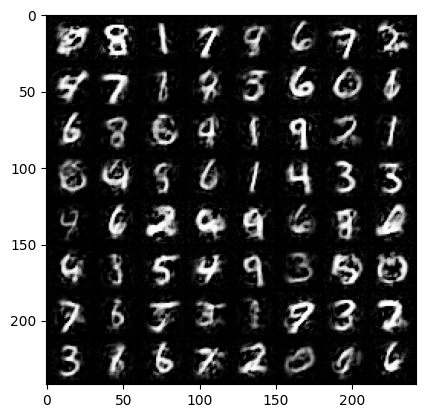

Epoch [72/80] Batch 0/938                   Loss D: -0.0016, Loss G: -0.0001
Epoch [72/80] Batch 100/938                   Loss D: -0.0005, Loss G: -0.0132
Epoch [72/80] Batch 200/938                   Loss D: -0.0015, Loss G: -0.0138
Epoch [72/80] Batch 300/938                   Loss D: 0.0111, Loss G: -0.0240
Epoch [72/80] Batch 400/938                   Loss D: 0.0020, Loss G: 0.0112
Epoch [72/80] Batch 500/938                   Loss D: 0.0004, Loss G: -0.0045
Epoch [72/80] Batch 600/938                   Loss D: -0.0014, Loss G: 0.0062
Epoch [72/80] Batch 700/938                   Loss D: -0.0041, Loss G: -0.0210
Epoch [72/80] Batch 800/938                   Loss D: -0.0063, Loss G: 0.0435
Epoch [72/80] Batch 900/938                   Loss D: 0.0002, Loss G: -0.0114


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.8957024..0.9999982].


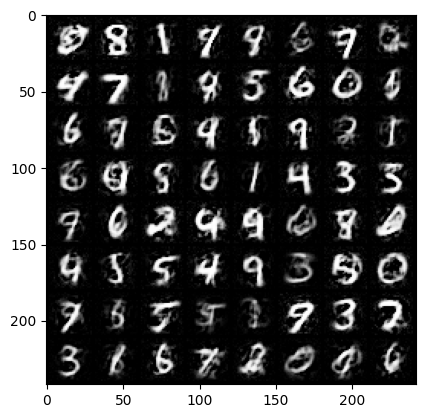

Epoch [73/80] Batch 0/938                   Loss D: -0.0043, Loss G: -0.0186
Epoch [73/80] Batch 100/938                   Loss D: -0.0003, Loss G: -0.0151
Epoch [73/80] Batch 200/938                   Loss D: -0.0009, Loss G: -0.0091
Epoch [73/80] Batch 300/938                   Loss D: 0.0002, Loss G: -0.0013
Epoch [73/80] Batch 400/938                   Loss D: -0.0008, Loss G: -0.0011
Epoch [73/80] Batch 500/938                   Loss D: -0.0043, Loss G: -0.0094
Epoch [73/80] Batch 600/938                   Loss D: -0.0023, Loss G: -0.0226
Epoch [73/80] Batch 700/938                   Loss D: 0.0006, Loss G: -0.0048
Epoch [73/80] Batch 800/938                   Loss D: 0.0021, Loss G: -0.0134
Epoch [73/80] Batch 900/938                   Loss D: 0.0027, Loss G: -0.0170


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.963246..0.9999972].


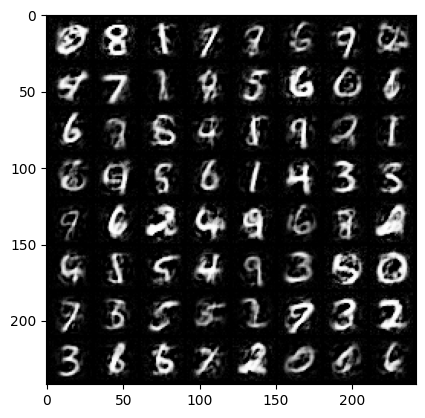

Epoch [74/80] Batch 0/938                   Loss D: -0.0003, Loss G: -0.0089
Epoch [74/80] Batch 100/938                   Loss D: 0.0003, Loss G: -0.0126
Epoch [74/80] Batch 200/938                   Loss D: 0.0000, Loss G: -0.0022
Epoch [74/80] Batch 300/938                   Loss D: -0.0015, Loss G: 0.0045
Epoch [74/80] Batch 400/938                   Loss D: 0.0034, Loss G: -0.0213
Epoch [74/80] Batch 500/938                   Loss D: 0.0009, Loss G: -0.0087
Epoch [74/80] Batch 600/938                   Loss D: 0.0021, Loss G: 0.0003
Epoch [74/80] Batch 700/938                   Loss D: -0.0011, Loss G: -0.0126
Epoch [74/80] Batch 800/938                   Loss D: -0.0011, Loss G: -0.0097
Epoch [74/80] Batch 900/938                   Loss D: -0.0016, Loss G: -0.0270


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9616844..0.9999919].


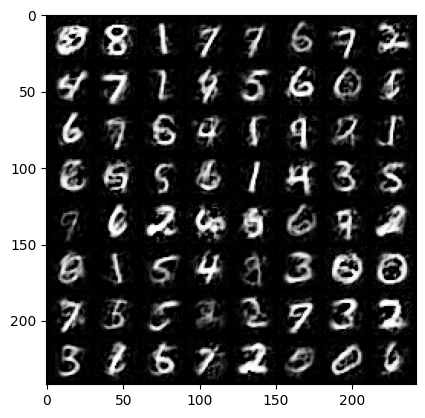

Epoch [75/80] Batch 0/938                   Loss D: -0.0015, Loss G: -0.0131
Epoch [75/80] Batch 100/938                   Loss D: 0.0053, Loss G: -0.0014
Epoch [75/80] Batch 200/938                   Loss D: 0.0003, Loss G: -0.0049
Epoch [75/80] Batch 300/938                   Loss D: 0.0015, Loss G: -0.0074
Epoch [75/80] Batch 400/938                   Loss D: 0.0005, Loss G: -0.0046
Epoch [75/80] Batch 500/938                   Loss D: -0.0071, Loss G: 0.0096
Epoch [75/80] Batch 600/938                   Loss D: 0.0010, Loss G: -0.0156
Epoch [75/80] Batch 700/938                   Loss D: -0.0014, Loss G: -0.0005
Epoch [75/80] Batch 800/938                   Loss D: 0.0029, Loss G: -0.0116
Epoch [75/80] Batch 900/938                   Loss D: -0.0010, Loss G: -0.0020


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.91631687..0.9999998].


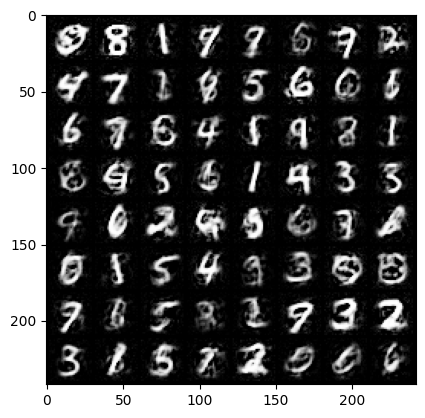

Epoch [76/80] Batch 0/938                   Loss D: 0.0019, Loss G: -0.0096
Epoch [76/80] Batch 100/938                   Loss D: -0.0005, Loss G: -0.0032
Epoch [76/80] Batch 200/938                   Loss D: 0.0007, Loss G: -0.0083
Epoch [76/80] Batch 300/938                   Loss D: -0.0017, Loss G: -0.0094
Epoch [76/80] Batch 400/938                   Loss D: 0.0010, Loss G: -0.0051
Epoch [76/80] Batch 500/938                   Loss D: 0.0011, Loss G: -0.0138
Epoch [76/80] Batch 600/938                   Loss D: 0.0012, Loss G: -0.0125
Epoch [76/80] Batch 700/938                   Loss D: -0.0013, Loss G: 0.0005
Epoch [76/80] Batch 800/938                   Loss D: 0.0003, Loss G: -0.0072
Epoch [76/80] Batch 900/938                   Loss D: -0.0007, Loss G: -0.0067


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9657524..0.9999957].


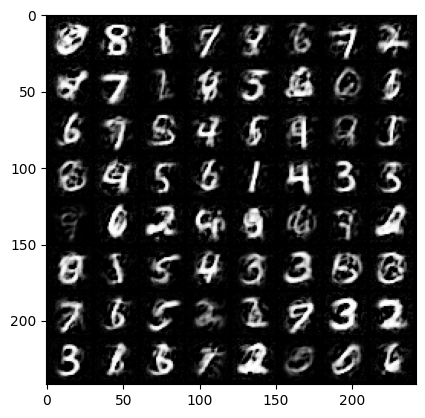

Epoch [77/80] Batch 0/938                   Loss D: -0.0001, Loss G: -0.0124
Epoch [77/80] Batch 100/938                   Loss D: 0.0019, Loss G: -0.0091
Epoch [77/80] Batch 200/938                   Loss D: 0.0001, Loss G: -0.0017
Epoch [77/80] Batch 300/938                   Loss D: -0.0003, Loss G: -0.0097
Epoch [77/80] Batch 400/938                   Loss D: -0.0008, Loss G: -0.0116
Epoch [77/80] Batch 500/938                   Loss D: -0.0007, Loss G: -0.0083
Epoch [77/80] Batch 600/938                   Loss D: 0.0002, Loss G: -0.0096
Epoch [77/80] Batch 700/938                   Loss D: -0.0003, Loss G: -0.0112
Epoch [77/80] Batch 800/938                   Loss D: -0.0003, Loss G: -0.0098
Epoch [77/80] Batch 900/938                   Loss D: 0.0002, Loss G: -0.0057


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9252616..0.99999785].


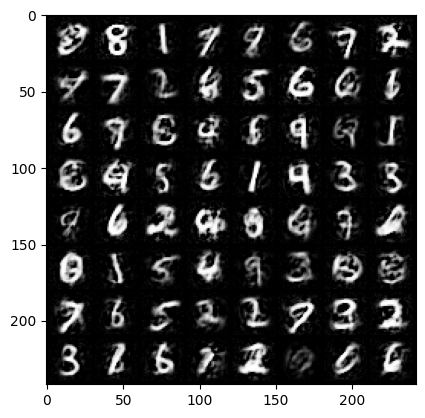

Epoch [78/80] Batch 0/938                   Loss D: -0.0006, Loss G: -0.0076
Epoch [78/80] Batch 100/938                   Loss D: -0.0005, Loss G: -0.0091
Epoch [78/80] Batch 200/938                   Loss D: 0.0006, Loss G: -0.0110
Epoch [78/80] Batch 300/938                   Loss D: -0.0009, Loss G: -0.0090
Epoch [78/80] Batch 400/938                   Loss D: -0.0011, Loss G: -0.0110
Epoch [78/80] Batch 500/938                   Loss D: 0.0001, Loss G: -0.0110
Epoch [78/80] Batch 600/938                   Loss D: -0.0007, Loss G: -0.0088
Epoch [78/80] Batch 700/938                   Loss D: 0.0011, Loss G: -0.0115
Epoch [78/80] Batch 800/938                   Loss D: 0.0002, Loss G: -0.0067
Epoch [78/80] Batch 900/938                   Loss D: -0.0006, Loss G: -0.0054


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.935065..0.9999965].


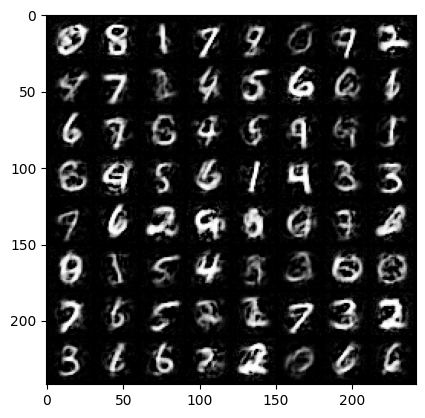

Epoch [79/80] Batch 0/938                   Loss D: -0.0009, Loss G: -0.0047
Epoch [79/80] Batch 100/938                   Loss D: 0.0001, Loss G: -0.0074
Epoch [79/80] Batch 200/938                   Loss D: -0.0008, Loss G: -0.0050
Epoch [79/80] Batch 300/938                   Loss D: 0.0002, Loss G: -0.0093
Epoch [79/80] Batch 400/938                   Loss D: 0.0011, Loss G: -0.0079
Epoch [79/80] Batch 500/938                   Loss D: -0.0006, Loss G: -0.0109
Epoch [79/80] Batch 600/938                   Loss D: 0.0002, Loss G: -0.0100
Epoch [79/80] Batch 700/938                   Loss D: -0.0004, Loss G: -0.0090
Epoch [79/80] Batch 800/938                   Loss D: 0.0011, Loss G: -0.0121
Epoch [79/80] Batch 900/938                   Loss D: -0.0001, Loss G: -0.0075


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.91416377..0.99999857].


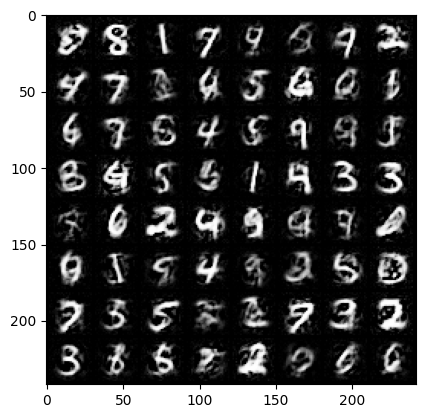

In [19]:
#Setting up the parameter and preparing the data
num_epochs = 80
fixed_noise = torch.randn(64,100, device=device)  # Fixed noise for generating images during training

for epoch in range(num_epochs):
    for i, (data, _) in enumerate(trainloader):
        real_data = data.to(device)
        batch_size = real_data.size(0)

        # Train the discriminator
        noise = torch.randn(batch_size, 100, device=device)
        fake_data = generator(noise)

        real_output = discriminator(real_data)
        fake_output = discriminator(fake_data.detach())

        lossD = discriminator_loss(real_output, fake_output)

        OptimizerD.zero_grad()
        lossD.backward()
        OptimizerD.step()

        # Clamp weights of discriminator to a fixed range for stability
        for p in discriminator.parameters():
            p.data.clamp_(-0.01, 0.01)

        # Train the generator
        fake_output = discriminator(fake_data)
        lossG = generator_loss(fake_output)

        OptimizerG.zero_grad()
        lossG.backward()
        OptimizerG.step()

        if i % 100 == 0:
            print(f'Epoch [{epoch}/{num_epochs}] Batch {i}/{len(trainloader)} \
                  Loss D: {lossD.item():.4f}, Loss G: {lossG.item():.4f}')

    with torch.no_grad():
        fake_images = generator(fixed_noise).detach().cpu()
    img_grid = torchvision.utils.make_grid(fake_images)
    np_img = img_grid.numpy()
    plt.imshow(np.transpose(np_img, (1, 2, 0)))
    plt.show()

In [20]:
torch.save(generator.state_dict(), 'generator.pth')
torch.save(discriminator.state_dict(), 'discriminator.pth')

In [ ]:


torch.cuda.empty_cache()  # Clear the CUDA cache if using GPU